# Assignment 1: Data Exploration

This is submission for Assignment 1 for student s3879312

Analyzing the [Stack Overflow Developer Survey](https://insights.stackoverflow.com/survey) Results 2021 dataset. 

## Hypothesis:

1. Woman in Tech involves more in 2021?
3. The compensation gaps between women and men are huge?
4. Do underrepresented countries in the survey like Vietnam tend to have less gender disparity in the Tech community?
5. Higher education to get a higher commission in women?
6. How does frequency participation in other online platforms affect commission?
7. What are the most common languages used by students? How does the list compare with the most common languages used by professional developers?
8. What are the most common job among respondents?
9. What are the most common languages among respondents who work in fields related to data science?
11. What are the most common languages used by developers in your home country?
12. What is the percentage participation in other online platforms?
13. Percentages of men higher than women in this survey

# 💾 TASK 1. DATA PREPARATION

### Libraries I'll use:

In [1]:
# import libraries general libraries

# work with data in tabular representation
import pandas as pd 
# round the data in the correlation matrix
import numpy as np

# Modules for data visualization
import seaborn as sns
import matplotlib.pyplot as plt 
import plotly.graph_objects as go 
import plotly.express as px 

from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot, plot #iplot() = plots the figure(fig) that is created by data and layout


# word cloud library
from wordcloud import WordCloud

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

plt.rcParams['figure.figsize'] = [6, 6]

# Ensure that our plots are shown and embedded within the Jupyter notebook itself. Without this command, sometimes plots may show up in pop-up windows
%matplotlib inline

# run a python file 
%run assignment1.py

# ignore DeprecationWarning Eror Messages
import warnings
warnings.filterwarnings('ignore')

In [2]:
# check version of Numpy (to create a requirements.txt)
np.__version__

'1.19.5'

In [3]:
# check version of Pandas (to create a requirements.txt)
pd.__version__

'1.3.4'

# Task 1.1: Inspect data

+ Downloaded the csv file and saved it in the working directory as `./Data/survey_results_schema.csv` (questions explanations) and `./Data/survey_results_public` (main data set)

+ Load the CSV data from the file. 

+ Use an appropriate pandas function to load the csv data, and make use of the arguments including sep, decimal, header, etc. if needed.

To analyze the user survey from **Stack Overflow Developer Survey Results 2021**, pandas will be used to load the dataset into a `DataFrame` so that it can be explored and visualized with Python. Pandas stores the file in an object called dataframe that stores the data in the form of rows and columns like a **2D array**. The responses have been anonymized to remove personally identifiable information, and each respondent has been assigned a randomized respondent ID.

+ The `survey_results_public.csv` is loaded into a `DataFrame` called `survey_public` and a seperator using **pipe**.
+ The `survey_results_schema.csv` is loaded into a `DataFrame` called `survey_question` and a seperator using **comma**.

+ `pd.read_csv` - Read data from a CSV file into a Pandas DataFrame object
+ `.info()` - View basic infomation about rows, columns & data types
+ `.describe()` - View statistical information about numeric columns
+ `.columns` - Get the list of column names
+ `.shape` - Get the number of rows & columns as a tuple

**In the data, each row represents a StackOverflow user and the columns are the responses to their user profiles which include multi-choice and short answer questions**

There are 6 sections in this survey. The 2nd, 3rd, and 4th sections will appear in a random order.

1. Basic Information
2. Education, Work, and Career
3. Technology and Tech Culture
4. Stack Overflow Usage + Community
5. Demographic Information
6. Final Questions

In [4]:
# import main dataframe
survey_public = pd.read_csv('Data/survey_results_public.csv', sep='|')

# print out first 3 lines of the dataframe
style(survey_public.head(5))

,ResponseId,MainBranch,Employment,Country,US_State,UK_Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,Currency,CompTotal,CompFreq,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly
0,1,I am a developer by profession,"Independent contractor, freelancer, or self-employed",Slovakia,nan,nan,"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",18 - 24 years,"Coding Bootcamp;Other online resources (ex: videos, blogs, etc)",nan,nan,"Developer, mobile",20 to 99 employees,EUR European Euro,4800.0,Monthly,C++;HTML/CSS;JavaScript;Objective-C;PHP;Swift,Swift,PostgreSQL;SQLite,SQLite,nan,nan,Laravel;Symfony,nan,nan,nan,nan,nan,PHPStorm;Xcode,Atom;Xcode,MacOS,Call a coworker or friend;Visit Stack Overflow;Go for a walk or other physical activity;Google it,Stack Overflow,Multiple times per day,Yes,A few times per month or weekly,"Yes, definitely",No,25-34 years old,Man,No,Straight / Heterosexual,White or of European descent,None of the above,None of the above,Appropriate in length,Easy,62268.000000
1,2,I am a student who is learning to code,"Student, full-time",Netherlands,nan,nan,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",11 - 17 years,"Other online resources (ex: videos, blogs, etc);School",7,nan,nan,nan,nan,nan,nan,JavaScript;Python,nan,PostgreSQL,nan,nan,nan,Angular;Flask;Vue.js,nan,Cordova,nan,Docker;Git;Yarn,Git,Android Studio;IntelliJ;Notepad++;PyCharm,nan,Windows,Visit Stack Overflow;Google it,Stack Overflow,Daily or almost daily,Yes,Daily or almost daily,"Yes, definitely",No,18-24 years old,Man,No,Straight / Heterosexual,White or of European descent,None of the above,None of the above,Appropriate in length,Easy,nan
2,3,"I am not primarily a developer, but I write code sometimes as part of my work","Student, full-time",Russian Federation,nan,nan,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",11 - 17 years,"Other online resources (ex: videos, blogs, etc);Online Forum",nan,nan,nan,nan,nan,nan,nan,Assembly;C;Python;R;Rust,Julia;Python;Rust,SQLite,SQLite,Heroku,nan,Flask,Flask,NumPy;Pandas;TensorFlow;Torch/PyTorch,Keras;NumPy;Pandas;TensorFlow;Torch/PyTorch,nan,nan,IPython/Jupyter;PyCharm;RStudio;Sublime Text;Visual Studio Code,IPython/Jupyter;RStudio;Sublime Text;Visual Studio Code,MacOS,Visit Stack Overflow;Google it;Watch help / tutorial videos;Do other work and come back later,Stack Overflow;Stack Exchange,Multiple times per day,Yes,Multiple times per day,"Yes, definitely",Yes,18-24 years old,Man,No,Prefer not to say,Prefer not to say,None of the above,None of the above,Appropriate in length,Easy,nan
3,4,I am a developer by profession,Employed full-time,Austria,nan,nan,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",11 - 17 years,nan,nan,nan,"Developer, front-end",100 to 499 employees,EUR European Euro,nan,Monthly,JavaScript;TypeScript,JavaScript;TypeScript,nan,nan,nan,nan,Angular;jQuery,Angular;jQuery,nan,nan,nan,nan,nan,nan,Windows,Call a coworker or friend;Visit Stack Overflow;Go for a walk or other physical activity;Google it,Stack Overflow,Daily or almost daily,Yes,Daily or almost daily,Neutral,No,35-44 years old,Man,No,Straight / Heterosexual,White or of European descent,I am deaf / hard of hearing,nan,Appropriate in length,Neither easy nor difficult,nan
4,5,I am a developer by profession,"Independent contractor, freelancer, or self-employed",United Kingdom of Great Britain and Northern Ireland,nan,England,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",5 - 10 years,Friend or family member,17,10,"

`survey_question` dataframe below a list of the questions and their options that were asked in the survey, provided by whoever wants the analysis. I read a seperate CSV file to reference this info that I can look at while working.

In [5]:
# This is for checking the columns in the above dataframe (survey_public) meaning, make qname become index column
survey_question = pd.read_csv('Data/survey_results_schema.csv', sep=',', index_col='qname')

# drop dropping items column-wise
survey_question = survey_question.drop("qid", axis=1)

# print out first 10 lines of the dataframe
survey_question.head(3)

,question,force_resp,type,selector
qname,,,,
S0,"<div><span style=""font-size:19px;""><strong>Hel...",False,DB,TB
MetaInfo,Browser Meta Info,False,Meta,Browser
S1,"<span style=""font-size:22px; font-family: aria...",False,DB,TB


In [6]:
#remove the top unsued rows in the questions schema
survey_question = survey_question.iloc[3:,:]

# view the first 3 rows
survey_question.head(3)

I have specified the rows to select and in the next line, I have retrieved those rows using the `loc` keyword. The indices of rows loc to get the specified rows that explain the associate with the columns' names in the `survey_public`

In [164]:
# get the detail info about the name column for the main data set, later I can access it via slices like a list
survey_question.loc['DevType']['question']

'Which of the following describes your current job? Please select all that apply.'

### Data Characteristics
I get the number of rows and columns in our DataFrame by calling `shape`.

In [8]:
# method to find the number of columns is to use .shape, which prints out the full dimensions of the data:
print(f'Dataframe contain {survey_public.shape[0]} records and {survey_public.shape[1]} columns.') # 83439 rows and 48 columns

Dataframe contain 83439 records and 48 columns.


**--------->** 
There are  83439 training examples in the dataset, this is a good sign since there seems to be enough data for machine learning. The shape of the dataset tells is that I have 48 attributes. Of the 48 attributes, one is the `ResponseId` – not useful as a feature – and later on one is the target variable that the model should predict, but not now. This means that I have 46 attributes that have the potential to be used to train my future predictive model.


# Clean data
Numerous factors such as data collection from multiple sources, or data corruption while storing or retrieving data, human errors in entering data, data loss while transferring data on some network can lead to incomplete, inconsistent, and incorrect data. If I use raw data as received in my analysis, then I will perform incorrect analysis and any conclusion drawn from the data will be wrong. 

### Understand the Data Structure
I have my DataFrame in place, so I get familiar with it by looking at the columns it contains:

In [9]:
# Print Column names
cols = survey_public.columns.values
print(cols)  

# Number of columns
num = len(survey_public.columns)
print("Number of columns: ", num)

['ResponseId' 'MainBranch' 'Employment' 'Country' 'US_State' 'UK_Country'
 'EdLevel' 'Age1stCode' 'LearnCode' 'YearsCode' 'YearsCodePro' 'DevType'
 'OrgSize' 'Currency' 'CompTotal' 'CompFreq' 'LanguageHaveWorkedWith'
 'LanguageWantToWorkWith' 'DatabaseHaveWorkedWith'
 'DatabaseWantToWorkWith' 'PlatformHaveWorkedWith'
 'PlatformWantToWorkWith' 'WebframeHaveWorkedWith'
 'WebframeWantToWorkWith' 'MiscTechHaveWorkedWith'
 'MiscTechWantToWorkWith' 'ToolsTechHaveWorkedWith'
 'ToolsTechWantToWorkWith' 'NEWCollabToolsHaveWorkedWith'
 'NEWCollabToolsWantToWorkWith' 'OpSys' 'NEWStuck' 'NEWSOSites'
 'SOVisitFreq' 'SOAccount' 'SOPartFreq' 'SOComm' 'NEWOtherComms' 'Age'
 'Gender' 'Trans' 'Sexuality' 'Ethnicity' 'Accessibility' 'MentalHealth'
 'SurveyLength' 'SurveyEase' 'ConvertedCompYearly']
Number of columns:  48


# Task 1.2: Check data types
The dtypes that pandas uses are: `float`, `int`, `bool`, `datetime`, `timedelta`, `category` and `object`. I modify data types in my DataFrames to help me transform them into more meaningful metrics

I am going to parse to all the columns to ensure that the loaded data has appropriate data types assigned.

I drop `ResponseId` to avoid leakage of the data. Moreover, the indexes of the reponses are not relevant for this problem. So I will omit it from the DataFrame and call the `info()` method to **check the data information**:


In [10]:
"""
    The info() method is useful to get a quick description of the data, 
    in particular the total number of rows, each attribute’s type and number of non-null values. 
    Drop the Id column and call the info() method to avoid leakage
"""
survey_public = survey_public.drop("ResponseId", axis=1)
survey_public.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83439 entries, 0 to 83438
Data columns (total 47 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   MainBranch                    83439 non-null  object 
 1   Employment                    83323 non-null  object 
 2   Country                       83439 non-null  object 
 3   US_State                      14920 non-null  object 
 4   UK_Country                    4418 non-null   object 
 5   EdLevel                       83126 non-null  object 
 6   Age1stCode                    83243 non-null  object 
 7   LearnCode                     82963 non-null  object 
 8   YearsCode                     81641 non-null  object 
 9   YearsCodePro                  61216 non-null  object 
 10  DevType                       66484 non-null  object 
 11  OrgSize                       60726 non-null  object 
 12  Currency                      61080 non-null  object 
 13  C

**--------->** 
+ The dtype of the dtypes attribute itself is an object. Series `objects` compose all DataFrames. 

+ I see that the `ComTotal` column is made up of objects, which will probably make my analysis of money more difficult. I’ll look at how to convert columns into numeric values 

+ The `info()` method tells me that I have 1 numerical attributes float64, and 46 categorical columns. 

+ Notice that I have many attributes that are not set for most of the responses. For example, the `DevType` attribute has 6648 non-null values, meaning that all other responses are missing this feature. I will need to take care of this later.

+ Most of the columns have a dtype of object (which suggests that they are strings), even though I saw in our initial inspection that these columns appear to contain numerical values

+ Here I have a mix of numerical and categorical attributes. Next, I will convert `object` data types into `string` datatypes


### Make the data homogeneous
+ Cast pandas objects to a specified dtype dtype (string)¶
+ Numeric data should have for example the same number of digits after the point. 
The `astype()` function supports all datatypes described at [this link](https://www.pytables.org/usersguide/datatypes.html).

In [11]:
"""
    convert_dtypes() method  convert columns to the best possible dtypes using dtypes supporting pd.NA (missing values). 
    This means that the dtype will be determined at runtime, based on the values included in the specified column(s).
"""
survey_public = survey_public.convert_dtypes()

# use the .info() method, which will print out a concise summary of the DataFrame:
survey_public.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83439 entries, 0 to 83438
Data columns (total 47 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   MainBranch                    83439 non-null  string
 1   Employment                    83323 non-null  string
 2   Country                       83439 non-null  string
 3   US_State                      14920 non-null  string
 4   UK_Country                    4418 non-null   string
 5   EdLevel                       83126 non-null  string
 6   Age1stCode                    83243 non-null  string
 7   LearnCode                     82963 non-null  string
 8   YearsCode                     81641 non-null  string
 9   YearsCodePro                  61216 non-null  string
 10  DevType                       66484 non-null  string
 11  OrgSize                       60726 non-null  string
 12  Currency                      61080 non-null  string
 13  CompTotal       

# Task 1.3: Missing values

According to **Chris Albon (Machine Learning with Python Cookbook)**, this decision should partially depend on how random missing values are.
[Missing Data in Pandas](https://pandas.pydata.org/pandas-docs/stable/user_guide/missing_data.html)

If so, use an appropriate function to **replace them** with one of the following values: 
- a fixed value 
- the column-wise median value 
- the column-wise mean value 
- the column-wise mode value 
- or ignoring all observations containing missing values.


Since I dont want all of my NaN values converted to string or numeric values, I'll treat the missing values before performing further cleaning and exploration:
`df['column_name'] = df['column_name'].fillna(value_to_fill_in)`


#### Why I check missing data before other cleaning steps?

+ By default, all of my missing values **are not counted** by `.value_counts()`and I do not want to convert my NA into a data type besides NA 

Therefore, the results of `survey_public['EdLevel'].value_counts()/len(survey_public['EdLevel'])` and `survey_public['EdLevel'].value_counts(normalize = True)` will be slightly different. I can set the dropna parameter in `.value_counts()` to determine how NaN values are handled in summaries of data.

When I divide the frequency of each category by `len(survey_public['EdLevel'])`, I'm calculating the proportion of a specific education level group as a portion of all people in the dataset. This is equivalent to setting `dropna = False` in the call to `value_counts()`.

In [12]:
education_proportions1 = survey_public.EdLevel.value_counts(normalize=True)
print("Education level proportion does not include NaN values: \n", education_proportions1, "\n\n")

education_proportions2 = survey_public.EdLevel.value_counts(normalize=True, dropna=False)
print("Education level proportion includes NaN values: \n", education_proportions2)

Education level proportion does not include NaN values: 
 Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          0.425342
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       0.210668
Some college/university study without earning a degree                                0.127385
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)    0.114693
Other doctoral degree (Ph.D., Ed.D., etc.)                                            0.030881
Primary/elementary school                                                             0.029822
Associate degree (A.A., A.S., etc.)                                                   0.026839
Something else                                                                         0.01926
Professional degree (JD, MD, etc.)                                                     0.01511
Name: EdLevel, dtype: Float64 


Education level proportion includes NaN values: 
 Bach

### Not all missing values come in nice and clean np.nan . 
If I know what kind of characters used as missing values in the dataset, I handle them while creating the DataFrame using na_values parameter:

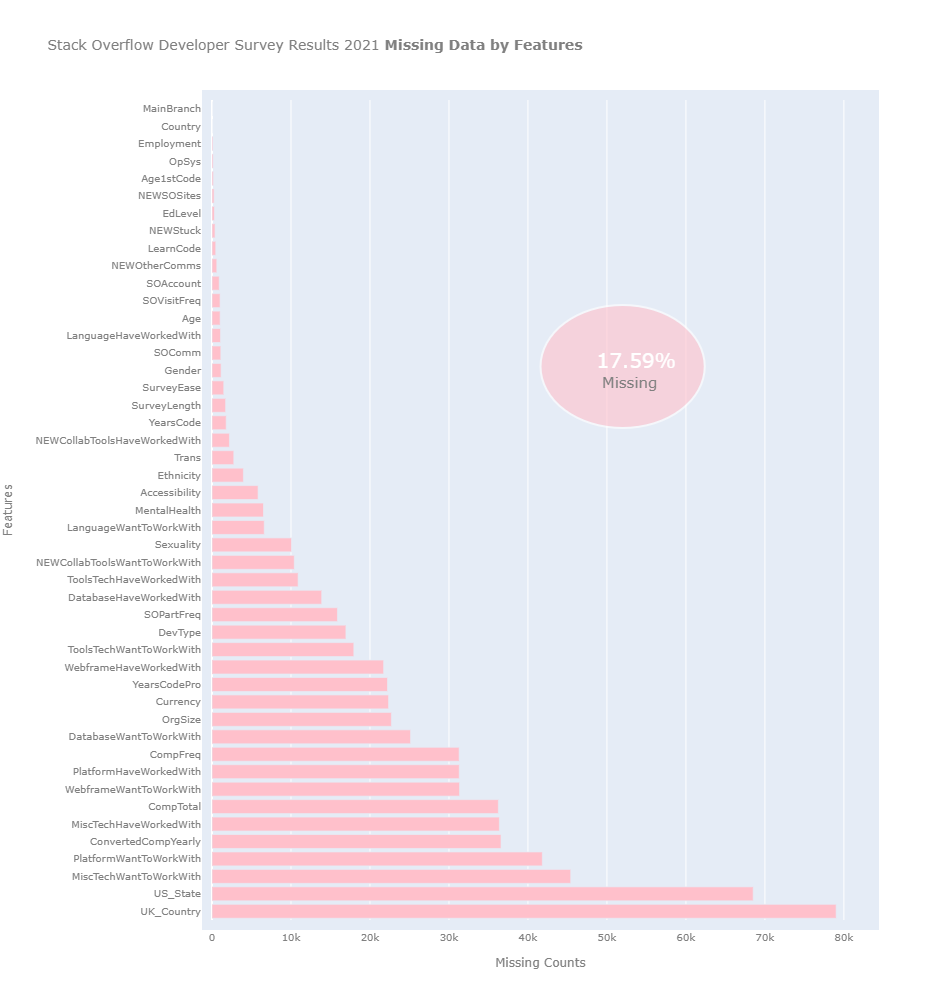

In [13]:
# visualize missing values percentage
missing_bar(survey_public)

In [14]:
"""
    Use the .isnull().sum() method get a sorted count of the missing values for all the attributes.
    will return a Boolean mask over the data. For example: df.isnull() returns a Boolean same-sized DataFrame indicating if values are missing
    check which columns have how many missing values
"""
print("Missing values in every column in ascending: \n" , survey_public.isnull().sum().sort_values(ascending=False))

Missing values in every column in ascending: 
 UK_Country                      79021
US_State                        68519
MiscTechWantToWorkWith          45418
PlatformWantToWorkWith          41820
ConvertedCompYearly             36595
MiscTechHaveWorkedWith          36384
CompTotal                       36256
WebframeWantToWorkWith          31344
PlatformHaveWorkedWith          31304
CompFreq                        31289
DatabaseWantToWorkWith          25140
OrgSize                         22713
Currency                        22359
YearsCodePro                    22223
WebframeHaveWorkedWith          21732
ToolsTechWantToWorkWith         17959
DevType                         16955
SOPartFreq                      15886
DatabaseHaveWorkedWith          13893
ToolsTechHaveWorkedWith         10902
NEWCollabToolsWantToWorkWith    10417
Sexuality                       10073
LanguageWantToWorkWith           6618
MentalHealth                     6519
Accessibility                    5836
Eth

**--------->** 
#### OBSERVATIONS:

+ I see US_State and US_Country have a lot of missing values which is **not reasonable** to replace `I do not reside in the United State` (UK) since the people did not respond, which does not mean they are not in the US or UK. 

+ Moreover, I want to include all other countries, not only particular ones. These 2 columns are not relevant to my future analysis so that I will drop them.

+ Dropping of columns where a certain percentage of not-null values is available via the thresh parameter. In this case, I drop columns with **equal or greater than 80% null** values.


### 1.3.1 Drop it
+ This is one of the most basic approaches to handle missing values

+ In this case, I drop columns or features that have a significant percentage of values missing (>80%) and columns that are not meaningful for my further visualization and model buidling

In [15]:
# drop columns have more than 80% null (UK_Country and US_State)
survey_public.dropna(thresh=0.2*len(survey_public),axis=1,inplace=True)

# Count the percentage of missing values for each column by dividing the previous result by the length of the dataset and multiplying per 100.
missing_percentage(survey_public)

MainBranch - 0.0%
Employment - 0.1%
Country - 0.0%
EdLevel - 0.4%
Age1stCode - 0.2%
LearnCode - 0.6%
YearsCode - 2.2%
YearsCodePro - 26.6%
DevType - 20.3%
OrgSize - 27.2%
Currency - 26.8%
CompTotal - 43.5%
CompFreq - 37.5%
LanguageHaveWorkedWith - 1.3%
LanguageWantToWorkWith - 7.9%
DatabaseHaveWorkedWith - 16.7%
DatabaseWantToWorkWith - 30.1%
PlatformHaveWorkedWith - 37.5%
PlatformWantToWorkWith - 50.1%
WebframeHaveWorkedWith - 26.0%
WebframeWantToWorkWith - 37.6%
MiscTechHaveWorkedWith - 43.6%
MiscTechWantToWorkWith - 54.4%
ToolsTechHaveWorkedWith - 13.1%
ToolsTechWantToWorkWith - 21.5%
NEWCollabToolsHaveWorkedWith - 2.6%
NEWCollabToolsWantToWorkWith - 12.5%
OpSys - 0.2%
NEWStuck - 0.5%
NEWSOSites - 0.3%
SOVisitFreq - 1.2%
SOAccount - 1.1%
SOPartFreq - 19.0%
SOComm - 1.3%
NEWOtherComms - 0.7%
Age - 1.2%
Gender - 1.4%
Trans - 3.3%
Sexuality - 12.1%
Ethnicity - 4.8%
Accessibility - 7.0%
MentalHealth - 7.8%
SurveyLength - 2.1%
SurveyEase - 1.8%
ConvertedCompYearly - 43.9%


In [16]:
# get the detail info about the name column for the main data set by accessing it via slices like a list
survey_question.loc['CompTotal']['question']

'What is your current total compensation (salary, bonuses, and perks, before taxes and deductions), in ${q://QID50/ChoiceGroup/SelectedChoicesTextEntry}? Please enter a whole number in the box below, without any punctuation. If you are paid hourly, please estimate an equivalent weekly, monthly, or yearly salary. If you prefer not to answer, please leave the box empty.'

**---------->** 
+ `CompTotal` is the total compensation paid according to `CompFreq` (should be all in Yearly), which convert into a `Currency` (USD) to be useful for visualization and model building.


+ However, I see that `CompTotal` and `ConvertedCompYearly` (total compensation yearly in USD) have the same meaning in this context. The only difference is that `CompTotal` values are not converted into a uniform unit. 

+ I decided to drop `CompTotal` along with `CompFreq` and `Currency` columns (which only useful to support the conversion of CompTotal). Such columns don't contain a lot of information and can be dropped altogether from the dataset since `ConvertedCompYearly` already do its job.

In [17]:
# Remove two columns name is 'CompTotal' and 'Currency', 'CompFreq'
survey_public = survey_public.drop(labels=['CompTotal', 'Currency', 'CompFreq'], axis = 1)

### 1.3.2 Create a new Category for NAN Values:

+ Another approach to handling missing values can be applied to all categorical columns since we do not consider assumptions. I create a new category for all missing values.

+ In this case, I will **replace** `NAN` values in some columns with **a new name**. I have used the term `prefer not to say` here.

+ This approach preserves the variance of my data. But if the missing data is a lot more, I will create only more random data. Hence this approach doesn't give me good results when there is a high percentage of missing data.

In [18]:
# Loop through columns have option 'prefer not to say' and fill null values with that value
for col in ['Employment', 'Trans', 'Sexuality', 'Ethnicity', 'Accessibility', 'MentalHealth']:
    survey_public[col] = survey_public[col].fillna("prefer not to say")

In [19]:
# Use function that imputes median to Impute age and assign to group_by_region['ConvertedCompYearly']
survey_public['ConvertedCompYearly'] = survey_public['ConvertedCompYearly'].transform(impute_median)

### 1.3.3 Frequent Categorical Imputation:

This is a method in which we **assume** that there is random order of missing values(MAR - Missing at Random) and there's a majority of these missing values. 

Under this approach we replace the missing values with the most common class, Hence the first step is to find out which category occurred most in each category using `mode()`.
* [The mode of a set of values is the value that appears most often]

In [20]:
# Imputes mode to NAN to the rest of categorical columns 
for column in survey_public.columns:
    survey_public[column].fillna(survey_public[column].mode()[0], inplace=True)

In [21]:
# Get the dataframe after filling in missing values
print('Shape of the dataframe after filling in missing values: ', survey_public.shape)

# Get the count again to verify that we do not have any more missing values
print("Total missing values left: ", survey_public.isnull().apply(sum).max())

Shape of the dataframe after filling in missing values:  (83439, 42)
Total missing values left:  0


### Getting the unique subcategories of each potential numeric columns
I want to convert the `YearsCode`, `YearsCodePro`, `ConvertedCompYearly`, `CompTotal` columns into numerical columns 
but I **doubted some of them contain string values**

+ The first what I have to do is getting the unique subcategories for each columns

+ From the above code block, I know that there is text in in my doubted numeric column instead of numbers. I first find out how many **distinct values** there are in these columns and then decide how to filter rows for the requirement.

In [22]:
print("Number of categories:",survey_public.YearsCode.nunique())
print("Categories:", survey_public.YearsCode.unique())

Number of categories: 52
Categories: <StringArray>
[                 '5',                  '7',                 '17',
                  '3',                  '4',                  '6',
                 '16',                 '12',                 '15',
                 '10',                 '40',                  '9',
                 '26',                 '14',                 '39',
                 '20',                  '8',                 '19',
   'Less than 1 year',                 '22',                  '2',
                  '1',                 '34',                 '21',
                 '13',                 '25',                 '24',
                 '30',                 '31',                 '18',
                 '38', 'More than 50 years',                 '27',
                 '41',                 '42',                 '35',
                 '23',                 '28',                 '11',
                 '37',                 '44',                 '43',
           

In [23]:
print("Number of categories:",survey_public.YearsCodePro.nunique())
print("Categories:", survey_public.YearsCodePro.unique())

Number of categories: 52
Categories: <StringArray>
[                 '3',                 '10',                  '4',
                  '5',                  '6',                  '2',
                 '30',                  '9',                 '18',
                 '12',                 '21',                  '1',
                 '16',   'Less than 1 year',                 '15',
                 '35',                  '7',                  '8',
                 '17',                 '14',                 '26',
                 '25',                 '20',                 '50',
                 '34',                 '11',                 '24',
                 '22',                 '13',                 '31',
                 '23',                 '39',                 '41',
                 '27',                 '28',                 '19',
                 '33', 'More than 50 years',                 '37',
                 '29',                 '32',                 '43',
           

**--------->** 

I want to covert `YearsCode` and `YearsCodePro` into numeric columns. So I will omit all the strings and replace the appropriate temporary number `Less than 1 year` -> `0.5` and `More than 50 years` -> `50.5`. 

This is only for the **ease of visualization**, not recommended for accurate calculations or operation that requires accuracy. 

In [24]:
# replace by represeting strings to numbers
survey_public['YearsCode'] = survey_public.YearsCode.apply(lambda x: str(x).replace('Less than 1 year','0.5').replace('More than 50 years','50.5').replace(' years','').replace(' year',''))
survey_public['YearsCodePro'] = survey_public.YearsCodePro.apply(lambda x: str(x).replace('Less than 1 year','0.5').replace('More than 50 years','50.5').replace(' years','').replace(' year',''))

In [25]:
print("Number of categories:", survey_public.ConvertedCompYearly.nunique())
print("Categories:", survey_public.ConvertedCompYearly.unique())

Number of categories: 8735
Categories: <IntegerArray>
[  62268,   56211,   51552,   46482,   77290,   17748,   46135,  160932,
   38915,   77831,
 ...
     450,   94250,   63683,   56120,    9536,      70,   15500, 4300000,
  160500,  816816]
Length: 8735, dtype: Int64


In [26]:
numeric_cols = ['ConvertedCompYearly', 'YearsCode', 'YearsCodePro']

# convert strings containing numerical values to integers or floats
survey_public[numeric_cols] = survey_public[numeric_cols].apply(pd.to_numeric, errors='coerce')

In [27]:
# select numerical columns
survey_public_numeric = survey_public.select_dtypes(include=[np.number])
numeric_cols = survey_public_numeric.columns.values
print("Numerical columns:", numeric_cols, "\n\n")

# select non-numeric columns
survey_public_non_numeric = survey_public.select_dtypes(exclude=[np.number])
non_numeric_cols = survey_public_non_numeric.columns.values
print("Non-numerical columns:", non_numeric_cols, "\n\n")

Numerical columns: ['YearsCode' 'YearsCodePro' 'ConvertedCompYearly'] 


Non-numerical columns: ['MainBranch' 'Employment' 'Country' 'EdLevel' 'Age1stCode' 'LearnCode'
 'DevType' 'OrgSize' 'LanguageHaveWorkedWith' 'LanguageWantToWorkWith'
 'DatabaseHaveWorkedWith' 'DatabaseWantToWorkWith'
 'PlatformHaveWorkedWith' 'PlatformWantToWorkWith'
 'WebframeHaveWorkedWith' 'WebframeWantToWorkWith'
 'MiscTechHaveWorkedWith' 'MiscTechWantToWorkWith'
 'ToolsTechHaveWorkedWith' 'ToolsTechWantToWorkWith'
 'NEWCollabToolsHaveWorkedWith' 'NEWCollabToolsWantToWorkWith' 'OpSys'
 'NEWStuck' 'NEWSOSites' 'SOVisitFreq' 'SOAccount' 'SOPartFreq' 'SOComm'
 'NEWOtherComms' 'Age' 'Gender' 'Trans' 'Sexuality' 'Ethnicity'
 'Accessibility' 'MentalHealth' 'SurveyLength' 'SurveyEase'] 




## Classify Columns 
[Click here to see detailed classification value type of this problem](https://mm.tt/2080716477?t=Gt5yNmz1fa)

**VARIABLE TYPE**
+ Index/ID
+ Predictor(features)
+ Target (label)

**DATA TYPE**
+ str
+ float
+ int
+ dtype
+ datetime
+ tuple
+ object

**VALUE TYPE**
+ qualitative 
+ quantitative


# Task 1.4: Typos
Check whether there are typos in the data. If there are any typos, correct.

### 1.4.1 Shorten values for easier to read and visualize

In [28]:
print("Number of categories:", survey_public.Age.nunique())
print("Categories:", survey_public.Age.unique())

Number of categories: 8
Categories: <StringArray>
[   '25-34 years old',    '18-24 years old',    '35-44 years old',
  'Prefer not to say',    '45-54 years old', 'Under 18 years old',
  '65 years or older',    '55-64 years old']
Length: 8, dtype: string


In [29]:
# replace all ' years old' with '' inside the Age column to shorten the values
survey_public['Age'] = survey_public.Age.apply(lambda x: str(x).replace(' years old','').replace(' years or older',' or older'))

In [30]:
print("Number of categories:", survey_public.Age1stCode.nunique())
print("Categories:", survey_public.Age1stCode.unique())

Number of categories: 9
Categories: <StringArray>
[       '18 - 24 years',        '11 - 17 years',         '5 - 10 years',
        '25 - 34 years',        '35 - 44 years', 'Younger than 5 years',
        '45 - 54 years',        '55 - 64 years',  'Older than 64 years']
Length: 9, dtype: string


In [31]:
# replace all ' years old' with '' inside the Age1stCode column to shorten the values
survey_public['Age1stCode'] = survey_public.Age1stCode.apply(lambda x: str(x).replace(' years',''))

In [32]:
print("Number of categories:", survey_public.Employment.nunique())
print("Categories:", survey_public.Employment.unique())

Number of categories: 10
Categories: <StringArray>
['Independent contractor, freelancer, or self-employed',
                                   'Student, full-time',
                                   'Employed full-time',
                                   'Student, part-time',
                                  'I prefer not to say',
                                   'Employed part-time',
                   'Not employed, but looking for work',
                                              'Retired',
               'Not employed, and not looking for work',
                                    'prefer not to say']
Length: 10, dtype: string


In [33]:
# replace all 'I prefer not to say' with 'Prefer not to say' inside the Age1stCode column to shorten the values
survey_public['Employment'] = survey_public.Employment.apply(lambda x: str(x).replace('I prefer not to say','prefer not to say').replace('Independent contractor, freelancer, or self-employed','freelancer'))

In [34]:
print("Number of categories:", survey_public.EdLevel.nunique())
print("Categories:", survey_public.EdLevel.unique())

Number of categories: 9
Categories: <StringArray>
['Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)',
                                       'Bachelor’s degree (B.A., B.S., B.Eng., etc.)',
                                    'Master’s degree (M.A., M.S., M.Eng., MBA, etc.)',
                                         'Other doctoral degree (Ph.D., Ed.D., etc.)',
                             'Some college/university study without earning a degree',
                                                                     'Something else',
                                                 'Professional degree (JD, MD, etc.)',
                                                          'Primary/elementary school',
                                                'Associate degree (A.A., A.S., etc.)']
Length: 9, dtype: string


In [35]:
# omit all the values inside the round brakets() in the EdLevel column to shorten the values
survey_public['EdLevel'] = survey_public.EdLevel.apply(lambda x: str(x)
                                                       .replace(' (e.g. American high school, German Realschule or Gymnasium, etc.)','')
                                                      .replace(' (B.A., B.S., B.Eng., etc.)','')
                                                      .replace(' (M.A., M.S., M.Eng., MBA, etc.)','')
                                                      .replace(' (Ph.D., Ed.D., etc.)','')
                                                      .replace(' (JD, MD, etc.)','')
                                                      .replace(' (A.A., A.S., etc.)','')
                                                       .replace('Some college/university study without earning a degree','college/university but no degree'))

In [36]:
survey_public['DevType'] = survey_public.DevType.apply(lambda x: str(x).replace(' (please specify):',''))

In [37]:
print("Number of categories:", survey_public.Gender.nunique())
print("Categories:", survey_public.Gender.unique())

Number of categories: 16
Categories: <StringArray>
[                                                                               'Man',
                                                                  'Prefer not to say',
                                                                              'Woman',
                                  'Non-binary, genderqueer, or gender non-conforming',
                                                         'Man;Or, in your own words:',
                            'Woman;Non-binary, genderqueer, or gender non-conforming',
                              'Man;Non-binary, genderqueer, or gender non-conforming',
                                                             'Or, in your own words:',
                                                                          'Man;Woman',
 'Man;Woman;Non-binary, genderqueer, or gender non-conforming;Or, in your own words:',
           'Non-binary, genderqueer, or gender non-conforming;Or, in your own w

In [38]:
survey_public['Gender'] = survey_public.Gender.apply(lambda x: str(x).replace('Or, in your own words:','in your own words'))

In [39]:
print("Number of categories:", survey_public.OrgSize.nunique())
print("Categories:", survey_public.OrgSize.unique())

Number of categories: 10
Categories: <StringArray>
[                                '20 to 99 employees',
                               '100 to 499 employees',
 'Just me - I am a freelancer, sole proprietor, etc.',
                           '10,000 or more employees',
                                 '10 to 19 employees',
                           '1,000 to 4,999 employees',
                               '500 to 999 employees',
                           '5,000 to 9,999 employees',
                                   '2 to 9 employees',
                                       'I don’t know']
Length: 10, dtype: string


In [40]:
survey_public['OrgSize'] = survey_public.OrgSize.apply(lambda x: str(x)
                                                       .replace('Just me - I am a freelancer, sole proprietor, etc.','freelancer'))

In [41]:
print("Number of categories:", survey_public.OpSys.nunique())
print("Categories:", survey_public.OpSys.unique())

Number of categories: 6
Categories: <StringArray>
[                            'MacOS',                           'Windows',
                       'Linux-based',                               'BSD',
           'Other (please specify):', 'Windows Subsystem for Linux (WSL)']
Length: 6, dtype: string


In [42]:
survey_public['OpSys'] = survey_public.OpSys.apply(lambda x: str(x).replace(' (please specify):','')
                                                   .replace('Windows Subsystem for Linux (WSL)','wsl'))

### 1.4.2 Different values for the same concept
It may happen that the same concept is represented in different ways. For example, in the dataset, the column `Country` contains the values `Viet Nam` and `Vietnam` to describe the same concept. I use the `unique()` function to list all the unique values of a column.

In order to deal with different values representing the same concept, I **manipulate each type of error separately**. For example, I can manipulate every string `Viet Nam` in order to delete a space inbetween and have the following output `Vietnam`. 

In [43]:
print("Number of categories:", survey_public.Country.nunique())       # 184/195 countries responded in the StackOverflow survey
print("Categories:", survey_public.Country.unique())

Number of categories: 184
Categories: <StringArray>
[                                            'Slovakia',
                                          'Netherlands',
                                   'Russian Federation',
                                              'Austria',
 'United Kingdom of Great Britain and Northern Ireland',
                             'United States of America',
                                             'Malaysia',
                                                'India',
                                               'Sweden',
                                                'Spain',
 ...
                                               'Guinea',
                                              'Liberia',
                                                 'Fiji',
                                                'Niger',
                                         'Sierra Leone',
                                           'San Marino',
                     'Saint Vin

In [44]:
# replace all 'Viet Nam' with 'Vietnam' inside the Country column to shorten the values
survey_public['Country'] = survey_public.Country.apply(lambda x: str(x).replace('Viet Nam','Vietnam'))

### 1.4.3 Check general spelling errors

In [45]:
# Check if spelling errors, shoul clean further if the number of before checking and after checking are different
for col in survey_public_non_numeric:
    print(f'Before: {col}: {len(set(survey_public[col]))} After: {col}: {len(set(survey_public[col].str.title().str.strip()))}')

Before: MainBranch: 6 After: MainBranch: 6
Before: Employment: 9 After: Employment: 9
Before: Country: 183 After: Country: 181
Before: EdLevel: 9 After: EdLevel: 9
Before: Age1stCode: 9 After: Age1stCode: 9
Before: LearnCode: 458 After: LearnCode: 458
Before: DevType: 8626 After: DevType: 8626
Before: OrgSize: 10 After: OrgSize: 10
Before: LanguageHaveWorkedWith: 28690 After: LanguageHaveWorkedWith: 28690
Before: LanguageWantToWorkWith: 27545 After: LanguageWantToWorkWith: 27545
Before: DatabaseHaveWorkedWith: 3072 After: DatabaseHaveWorkedWith: 3072
Before: DatabaseWantToWorkWith: 3137 After: DatabaseWantToWorkWith: 3137
Before: PlatformHaveWorkedWith: 118 After: PlatformHaveWorkedWith: 118
Before: PlatformWantToWorkWith: 126 After: PlatformWantToWorkWith: 126
Before: WebframeHaveWorkedWith: 5402 After: WebframeHaveWorkedWith: 5402
Before: WebframeWantToWorkWith: 5113 After: WebframeWantToWorkWith: 5113
Before: MiscTechHaveWorkedWith: 1387 After: MiscTechHaveWorkedWith: 1387
Before: M

**--->**
Indeed, there are typos in the `Country`, `Trans`, `Sexuality`, `Accessibility`, `MentalHealth` column. Let's fix it.

In [46]:
# Correct the errors
survey_public.Country = survey_public.Country.str.title().str.strip()
survey_public.Trans = survey_public.Trans.str.title().str.strip()
survey_public.Sexuality = survey_public.Sexuality.str.title().str.strip()
survey_public.Accessibility = survey_public.Accessibility.str.title().str.strip()
survey_public.MentalHealth = survey_public.MentalHealth.str.title().str.strip()
survey_public.Ethnicity = survey_public.Ethnicity.str.title().str.strip()

In [47]:
# Check if spelling errors already fixed
for col in survey_public_non_numeric:
    print(f'Before {col}: {len(set(survey_public[col]))} After {col}: {len(set(survey_public[col].str.title().str.strip()))}')

Before MainBranch: 6 After MainBranch: 6
Before Employment: 9 After Employment: 9
Before Country: 181 After Country: 181
Before EdLevel: 9 After EdLevel: 9
Before Age1stCode: 9 After Age1stCode: 9
Before LearnCode: 458 After LearnCode: 458
Before DevType: 8626 After DevType: 8626
Before OrgSize: 10 After OrgSize: 10
Before LanguageHaveWorkedWith: 28690 After LanguageHaveWorkedWith: 28690
Before LanguageWantToWorkWith: 27545 After LanguageWantToWorkWith: 27545
Before DatabaseHaveWorkedWith: 3072 After DatabaseHaveWorkedWith: 3072
Before DatabaseWantToWorkWith: 3137 After DatabaseWantToWorkWith: 3137
Before PlatformHaveWorkedWith: 118 After PlatformHaveWorkedWith: 118
Before PlatformWantToWorkWith: 126 After PlatformWantToWorkWith: 126
Before WebframeHaveWorkedWith: 5402 After WebframeHaveWorkedWith: 5402
Before WebframeWantToWorkWith: 5113 After WebframeWantToWorkWith: 5113
Before MiscTechHaveWorkedWith: 1387 After MiscTechHaveWorkedWith: 1387
Before MiscTechWantToWorkWith: 1684 After M

# Task 1.5: Extra-whitespaces

Check whether there are instances of extra whitespaces in the data and demonstrate how to remove them by calling on an appropriate function.


### Why are white spaces a problem?

+ Comparison failures

String with and without blank spaces is not the same. `'Vietnmam'`"!= `' Vietnam'` these two ABCs are not equal, but the difference is so slight that you often don't notice. Without the quotes enclosing the string, you hardly would `Vietnmam`!=` Vietnam`. But the computer programs are incorruptible in the interpretation, and if these values are a merging key, you will receive an empty result.

+ NaN Value

Blank strings, spaces, and tabs are considered empty values represented as NaN in Pandas on many occasions. But an indefinite number of spaces is not turned into NaN values automatically, and you can get unexpected results because for example, **count(NaN) = 0** while **count("")= 1**.

+ Size

Even though the white spaces are almost invisible, pile millions of them into the file, and they will take some space. Other times they can overflow the size limit of your database column leading to an error in the better case and trimming the final character whose place was stolen by the blank space in front.

In [48]:
 """
        Remove extra leading and tailing whitespace from the data.
         pass dataframe as a parameter and apply whitespace_remover function on dataframe
"""
whitespace_remover(survey_public)

# Task 1.6: Upper/Lower-case

+ Categorical data should have all the uniform formatting style, such as lower case. 

+ I will cast all categorical data to lower case, I can use the following statement:


In [49]:
# Cast all values inside the dataframe (except the columns' name) into lowercase
survey_public = survey_public.applymap(lambda s: s.lower() if type(s) == str else s)

# Task 1.7: Sanity checks
Design and run a small test-suite, consisting of a series of sanity checks to test for the presence of **impossible values** and **outliers** for each attribute.

### 1.7.1 Check for the presence of duplicates

+ The **user presses the submit button twice.** In order to check whether a record is duplicated or not, I can exploit the `duplicated()` function, which returns `True` if a record has other duplicates, `False` otherwise.

+ Use the pandas function `.drop_duplicates()` to remove copied rows from a DataFrame

In [50]:
# Calculate the number duplicates records.
duplicates = survey_public.duplicated()

# Print out the .value_counts() of the duplicates Series to see how many rows are exact duplicates
print(duplicates.value_counts())
print("Number of duplicated records: ", survey_public.duplicated().sum())

False    83438
True         1
dtype: int64
Number of duplicated records:  1


In [51]:
# Drop duplicate row
survey_public = survey_public.drop_duplicates()

### 1.7.2 Impossible Values

+ These are data points that are not outliers globally but are **outliers in their own context**. These values are often harder to deal with since it requires domain knowledge and highly manual finding.

+ Fortunately, This survey did an excellent job by making the survey form UI less error-prone by designing input forms to be **radios, drop-down menus, and checkboxes** instead of letting the users freely enter a nonnegligible value by themselves. 

+ However, there are still some unreasonable values. For instance, the number of years of coding is `51.0` years while the person's age ranges from `18-24 years old` or the number of professionally coded is `26.0`, while the number of normal years coded includes education is only `25.0`.  

In [145]:
print("Number of categories:", survey_public.Age.nunique())
print("Categories:", survey_public.Age.unique())

Number of categories: 8
Categories: ['25-34' '18-24' '35-44' 'prefer not to say' '45-54' 'under 18'
 '65 or older' '55-64']


In [147]:
# check whether yearscode exceed the age range
age_under_18 = ['under 18']
survey_public.loc[(survey_public['YearsCode'] > 18) & survey_public['Age'].isin(age_under_18), 'YearsCode'] = 18
temp = survey_public[(survey_public['YearsCode'] > 18) & survey_public['Age'].isin(age_under_18)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


In [144]:
# check whether yearscode exceed the age range
age_18_24 = ['18-24']
survey_public.loc[(survey_public['YearsCode'] > 24) & survey_public['Age'].isin(age_18_24), 'YearsCode'] = 24
temp = survey_public[(survey_public['YearsCode'] > 24) & survey_public['Age'].isin(age_18_24)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


In [149]:
# check whether yearscode exceed the age range
age_25_34 = ['25-34']
survey_public.loc[(survey_public['YearsCode'] > 34) & survey_public['Age'].isin(age_25_34), 'YearsCode'] = 34
temp = survey_public[(survey_public['YearsCode'] > 34) & survey_public['Age'].isin(age_25_34)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


In [150]:
# check whether yearscode exceed the age range
age_35_44 = ['35-44']
survey_public.loc[(survey_public['YearsCode'] > 44) & survey_public['Age'].isin(age_35_44), 'YearsCode'] = 44
temp = survey_public[(survey_public['YearsCode'] > 44) & survey_public['Age'].isin(age_35_44)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


In [151]:
# check whether yearscode exceed the age range
age_45_54 = ['45-54']
survey_public.loc[(survey_public['YearsCode'] > 54) & survey_public['Age'].isin(age_45_54), 'YearsCode'] = 54
temp = survey_public[(survey_public['YearsCode'] > 54) & survey_public['Age'].isin(age_45_54)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


In [152]:
# check whether yearscode exceed the age range
age_55_64 = ['55-64']
survey_public.loc[(survey_public['YearsCode'] > 64) & survey_public['Age'].isin(age_55_64), 'YearsCode'] = 64
temp = survey_public[(survey_public['YearsCode'] > 64) & survey_public['Age'].isin(age_55_64)]
temp

,MainBranch,Employment,Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly


### 1.7.3 Outliers
Outliers are observations that are significantly distant from other observations. 

##### Sources of outliers
Outliers can be caused by a variety of reasons. Some common ones are:

+ Errors in entering data.
+ Errors in collecting and merging data from multiple sources.
+ Errors in processing data.
+ Natural variance because of some unknown reason.

#### Box Plots

Median (50th percentile) = middle value of the data set. Sort and take the data in the middle. It is also called 50% percentile that is 50% of data are less that median(50th quartile)(quartile)

+ 25th percentile = quartile 1 (Q1) that is lower quartile
+ 75th percentile = quartile 3 (Q3) that is higher quartile
+ Height of box = IQR = interquartile range = Q3-Q1
+ Whiskers = 1.5 * IQR from the Q1 and Q3
+ Outliers = being more than 1.5*IQR away from median commonly.

##### Types of outliers

Outliers can be classified into three broad categories:

1. Point or Global outliers

2. Collective outliers

#### 7.3.1  Point or Global outliers

These are observations that deviate from all of the other observations

In [52]:
# Basic stats of the data, .T for transposing index and columns
style(survey_public.describe().T)

,count,mean,std,min,25%,50%,75%,max
YearsCode,83438.000000,12.187882,9.769923,0.500000,5.000000,9.000000,16.000000,50.500000
YearsCodePro,83438.000000,7.553111,7.571764,0.500000,3.000000,4.000000,10.000000,50.500000
ConvertedCompYearly,83438.000000,91140.008629,396294.418044,1.000000,50000.000000,56211.000000,64287.000000,45241312.000000


**-------------->**
#### OBSERVATIONS:

+ From the output, it is clear that something is not correct. The max value seems to be abnormally large compared to the mean and median values. 

+ There seems to be a problem with the `ConvertedCompYearly` column, as the minimum value is 1.0 USD and the maximum is 45 241 312.0 USD. This is a common issue with surveys: responses may contain invalid values due to accidental or intentional errors while responding. A simple fix would be to ignore the rows where the `ConvertedCompYearly` is higher than **64287.0** years or lower than **50000.0** USD as invalid survey responses. I can do this using the `.drop` method, [as explained here](https://www.geeksforgeeks.org/drop-rows-from-the-dataframe-based-on-certain-condition-applied-on-a-column/).

+ However, I'm going to gain a more holistic perspective by observing the head and tail of the whiskier + median of `ConvertedCompYearly` for each country inside the data set.

In [53]:
"""
    The first line calculates the values of the 25th and 75th percentiles. 
    It then takes the difference between the two to get the interquartile range (iqr). 
    I get the length of the whiskers by multiplying the iqr by 1.5 and then calculate the min and max whisker value by subtracting 
    and adding the whisker length from the 25th and 75th percentile values. 
"""
style(calculate_min_max_whisker(survey_public).T)

,0.25,0.75,iqr,whisker_length,max_whisker,min_whisker
YearsCode,5.000000,16.000000,11.000000,16.500000,32.500000,-11.500000
YearsCodePro,3.000000,10.000000,7.000000,10.500000,20.500000,-7.500000
ConvertedCompYearly,50000.000000,64287.000000,14287.000000,21430.500000,85717.500000,28569.500000


In [54]:
# Calling the function to get median Yearly Compensation for each Country in USD
print(group_median_aggregation(survey_public, "Country", "ConvertedCompYearly"))

Country
san marino                                              326455.5
united states of america                                 87000.0
switzerland                                              73188.0
denmark                                                  71208.0
norway                                                   67435.0
iceland                                                  60396.0
nigeria                                                  56211.0
nepal                                                    56211.0
netherlands                                              56211.0
new zealand                                              56211.0
nicaragua                                                56211.0
niger                                                    56211.0
north korea                                              56211.0
nomadic                                                  56211.0
mozambique                                               56211.0
oman             

In [55]:
survey_question.loc['CompTotal']['question']

'What is your current total compensation (salary, bonuses, and perks, before taxes and deductions), in ${q://QID50/ChoiceGroup/SelectedChoicesTextEntry}? Please enter a whole number in the box below, without any punctuation. If you are paid hourly, please estimate an equivalent weekly, monthly, or yearly salary. If you prefer not to answer, please leave the box empty.'

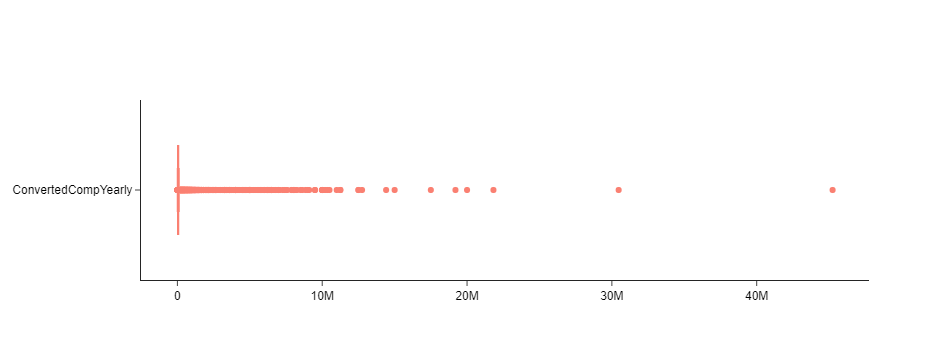

In [56]:
# Let's set the visualization parameters
fig_ConvertedCompYearly_box = make_subplots(rows=1, cols=1, specs=[[{'type': 'xy'}]])

# Setting Box parameters
fig_ConvertedCompYearly_box.add_trace(go.Box(x=survey_public['ConvertedCompYearly'], 
                       name='ConvertedCompYearly'))

# Setting the parameters of the Box when displaying
fig_ConvertedCompYearly_box.update_traces(marker_color='Salmon')

# Setting the parameters of the Box when displaying
fig_ConvertedCompYearly_box.update_layout(showlegend=False, 
                    template='simple_white', 
                    font=dict(family='Arial', 
                              size=12, 
                              color='black'))

# Displaying the Box
fig_ConvertedCompYearly_box.show()

**------>**  
#### Observations

+ Data is asymmetry and not distributed normally (right-skewed)

+ It is clear from the boxplot that the observation corresponding to the **maximum value** (45241312.0) is an outlier in this data.

+ I can deal with outliers just like I dealt with missing values. I can replace the outliers with suitable values by performing some sort of transformation on the data (like impute median). 

+ I see the **median compensation yearly between countries** is 326 455.5 USD (highest - san marino) and 8 382.0 USD (lowest - madagascar)

+ The **max_whisker**: 85 717.5 USD and **min_whisker**: 28 569.5 USD

-> I will convert all the rows has more than 326 455.5 USD into NAN and impute median

##### Covert outliers into NAN and Impute them

In [57]:
# .where() function replaces ConvertedCompYearly values greater or equal to 326455.5 with NaN values
survey_public['ConvertedCompYearly'] = survey_public['ConvertedCompYearly'].where(survey_public['ConvertedCompYearly'] < 326455.5, np.nan) 
 
# .sum() counts the number of missing values in each column
survey_public.isna().sum() 

MainBranch                         0
Employment                         0
Country                            0
EdLevel                            0
Age1stCode                         0
LearnCode                          0
YearsCode                          0
YearsCodePro                       0
DevType                            0
OrgSize                            0
LanguageHaveWorkedWith             0
LanguageWantToWorkWith             0
DatabaseHaveWorkedWith             0
DatabaseWantToWorkWith             0
PlatformHaveWorkedWith             0
PlatformWantToWorkWith             0
WebframeHaveWorkedWith             0
WebframeWantToWorkWith             0
MiscTechHaveWorkedWith             0
MiscTechWantToWorkWith             0
ToolsTechHaveWorkedWith            0
ToolsTechWantToWorkWith            0
NEWCollabToolsHaveWorkedWith       0
NEWCollabToolsWantToWorkWith       0
OpSys                              0
NEWStuck                           0
NEWSOSites                         0
S

In [59]:
# impute median with NAN
survey_public["ConvertedCompYearly"] = survey_public["ConvertedCompYearly"].fillna(survey_public.groupby("Country")["ConvertedCompYearly"].transform('median'))
survey_public['ConvertedCompYearly'] = survey_public['ConvertedCompYearly'].transform(impute_median)

In [60]:
# Get the dataframe after filling in missing values
print('Shape of the dataframe after filling in missing values: ', survey_public.shape)

# Get the count again to verify that we do not have any more missing values
print("Total missing values left: ", survey_public.isnull().apply(sum).max())

Shape of the dataframe after filling in missing values:  (83438, 42)
Total missing values left:  0


<AxesSubplot:>

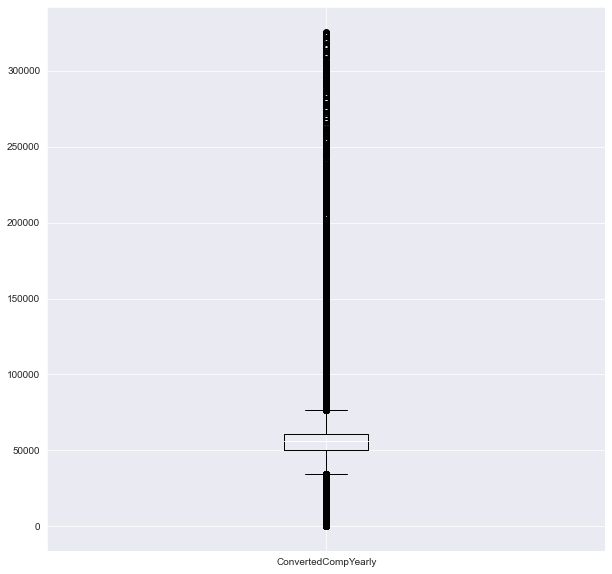

In [163]:
survey_public.boxplot(column=['ConvertedCompYearly'])

#### 2. Collective outliers

`YearsCode` and `YearsCodePro` are a group of observations that are outliers globally from the rest of the observations (outsisde of the whiskier) but are not outliers within the group. Therefore, I would not remove them

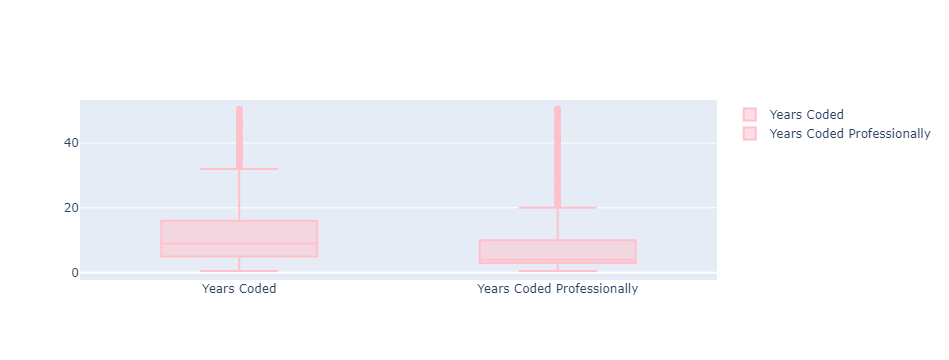

In [70]:
# box plot

years_code = go.Box(
    y=survey_public.YearsCode,
    name = 'Years Coded',
    marker = dict(
        color = 'rgb(255,192,203)',
    )
)
# 
years_code_pro = go.Box(
    y=survey_public.YearsCodePro,
    name = 'Years Coded Professionally',
    marker = dict(
        color = 'rgb(255,192,203)',
    )
)
data = [years_code, years_code_pro]
iplot(data)

# Task 1.8: Categorical data
Encode categorical data into digits to fit and evaluate model.

#### Few reasons why categorical values can be difficult to deal with are:

- High cardinality (Features with a large number of levels)
- Algebraic Machine Learning models, whose input must be numerical. (Hence categorical must be transformed into numbers before applying a learning algorithm to them)
- It is difficult for an ML model to differentiate between highly different levels. For example, for an ML model, `20 to 99 employees`, `100 to 499 employees`, and `10,000 or more employees` are just **3 different levels**.

I'll work with a small part of the entire data frame to demonstrate different encoding techniques and which one I choose for this project. 

### 1.8.1 Label encoding - Ordinal Values

By converting each value in the column into a number. I use this encoding technique when the categorical feature is ordinal, **ordered categories**. Hence encoding should reflect the sequence. 

In Label encoding, each label is converted into an integer value and these integers are always between 0 and 1.  

#### a. One way of achieving this is by using pandas `cat.codes` on my categorical column.

Since this method requires me to convert string data type columns into category data types, I'll use the second method as my main

In [71]:
# cast the column into category data types
survey_public['EdLevel'] = survey_public['EdLevel'].astype("category")

# create a copy of the main dataframe
survey_public_lc_example = survey_public.copy()

# label encoding
survey_public_lc_example['EdLevel'] = survey_public_lc_example['EdLevel'].cat.codes

# print out 3 sample rows of the dataframe
# style(survey_public_lc_example.sample(3))

#### b. Using `scikit-learn`'s - `LabelEncoder` or `category_encoders` - I use this 

I see that I just had to use the `OrdinalEncoder()` call on my series, and it automatically makes new columns for each unique value in my series and fills them with number level as appropriate.

In [72]:
!pip install category_encoders --quiet
import category_encoders as ce

# ordinal columns using OrdinalEncoder
cols_lc = ['Age1stCode', 'OrgSize', 'SOVisitFreq', 'SOPartFreq','SurveyLength','SurveyEase', 'Age', 'SOVisitFreq']

encoder = ce.OrdinalEncoder(cols=cols_lc,return_df=True)

# create an encoded dataframe
survey_public_encoded = survey_public.copy()

# transform on the encoded dataframe
survey_public_encoded = encoder.fit_transform(survey_public_encoded)

# print out random 3 sample rows 
# style(survey_public_encoded.sample(3))

## 1.8.2 One-hot encoding - Nominal Values



### a. Dummy Variables

This encoding technique is used when the features are nominal - **no order**.  For example, in this dataset, the column `LanguageHaveWorkedWith` is categorical, but I can not arrange them in a sequence.

Dummy variables are created to deal with the categorical variables. Dummy variables will turn the categories per variable into its own binary identifier. 

The `LanguageHaveWorkedWith` has one column for each option that can be selected as a response. If a respondent has chosen an option, the corresponding column's value is `1`. Otherwise, it is `0`. If the respondents chose several options, they are separated by `;` which I will use `.get_dummies(sep=';')` to split them into distinct columns.

[Each string in Series is split by sep and returned as a DataFrame of dummy/indicator variables](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.get_dummies.html)

In [73]:
# nominal columns that are separated values by semi commas
sep_semicomma_cols = ['LearnCode', 'DevType', 'LanguageHaveWorkedWith', 'LanguageWantToWorkWith', 'DatabaseHaveWorkedWith', 
 'DatabaseWantToWorkWith', 'PlatformHaveWorkedWith', 'PlatformWantToWorkWith', 'WebframeHaveWorkedWith', 'WebframeWantToWorkWith',
 'MiscTechHaveWorkedWith', 'MiscTechWantToWorkWith', 'ToolsTechHaveWorkedWith', 'ToolsTechWantToWorkWith', 
 'NEWCollabToolsHaveWorkedWith', 'NEWCollabToolsWantToWorkWith', 'NEWStuck', 'NEWSOSites', 'Gender', 
 'Sexuality', 'Accessibility', 'MentalHealth']

In [74]:
survey_question.loc['Language']['question']

'Which <b>programming, scripting, and markup languages</b> have you done extensive development work in over the past year, and which do you want to work in over the next year? (If you both worked with the language and want to continue to do so, please check both boxes in that row.)'

In [75]:
languages_worked_dummy= survey_public['LanguageHaveWorkedWith'].str.get_dummies(sep=';')
style(languages_worked_dummy.head(3))

,apl,assembly,bash/shell,c,c#,c++,clojure,cobol,crystal,dart,delphi,elixir,erlang,f#,go,groovy,haskell,html/css,java,javascript,julia,kotlin,lisp,matlab,node.js,objective-c,perl,php,powershell,python,r,ruby,rust,scala,sql,swift,typescript,vba
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0


In [120]:
gender_dummy = survey_public.copy()

# Convert categorical variable into dummy/indicator variables.
gender_dummy = gender_dummy['Gender'].str.get_dummies(sep=';')

# style(gender_dummy.head(3))

#### b. using `scikit-learn`'s `LabelBinarizer` and `OneHotEncoder` or even with `category_encoders`: 
 
While one-hot encoding solves the problem of unequal weights given to categories within a feature, which is **not useful when there are many categories**, as that will result in the formation of as many new columns, which can result in the curse of dimensionality.

The concept of the **curse of dimensionality** discusses that in high-dimensional spaces some things just **stop working** properly.

## 1.8.3 Binary Encoding

+ This is a combination of **one-hot encoding and Hash encoding**. In this encoding scheme, the categorical feature is first converted into numerical using an ordinal encoder. Then the numbers are transformed into a binary number. After that binary value is split into different columns. This results in **fewer columns compared to one-hot encoding.**

Binary encoding works well when there are a **high number of categories**. For example, the 2 `Country` and `Ethnicity` columns in my dataset.  

You must wonder why don't we stop after the ordinal encoding part itself, or why is a need for having to convert them into their binary equivalent only to further make columns. Here's one reason why, 

- When our **categorical column is not ordinal, and the number of categories is numerous, we can not apply only Label Encoding**, as that will lead to poor decision-making of our model. Unlike the case of ordinal columns. Having one-fourth of the total number of categories as columns in the dataframe can help in better decision-making of our model.  

Once again I have used the `category_encoders` library and its `.BinaryEncoder` function to achieve this.

**Binary encoding is a memory-efficient encoding scheme as it uses fewer features than one-hot encoding. Further, It reduces the curse of dimensionality for data with high cardinality.**

In [80]:
# columns have high number of categories
cols_binary = ['Country', 'Ethnicity']

# perform binary encoding
encoder = ce.BinaryEncoder(cols=cols_binary)
survey_public_encoded = encoder.fit_transform(survey_public_encoded)

# print out random 3 sample rows
style(survey_public_encoded.sample(3))

,MainBranch_i am a developer by profession,MainBranch_i am a student who is learning to code,"MainBranch_i am not primarily a developer, but i write code sometimes as part of my work",MainBranch_i code primarily as a hobby,"MainBranch_i used to be a developer by profession, but no longer am",MainBranch_none of these,Employment_freelancer,"Employment_student, full-time",Employment_employed full-time,"Employment_student, part-time",Employment_prefer not to say,Employment_employed part-time,"Employment_not employed, but looking for work",Employment_retired,"Employment_not employed, and not looking for work",Country_0,Country_1,Country_2,Country_3,Country_4,Country_5,Country_6,Country_7,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys_macos,OpSys_windows,OpSys_linux-based,OpSys_bsd,OpSys_other,OpSys_wsl,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount_yes,SOAccount_not sure/can't remember,SOAccount_no,SOPartFreq,"SOComm_yes, definitely",SOComm_neutral,"SOComm_yes, somewhat","SOComm_no, not at all","SOComm_no, not really",SOComm_not sure,NEWOtherComms_no,NEWOtherComms_yes,Age,Gender,Trans,Sexuality,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,Ethnicity_6,Ethnicity_7,Ethnicity_8,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly
35655,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,0,1,0,0,secondary school,3,school;online forum;online courses or certification;books / physical media,9.000000,0.500000,"developer, full-stack",4,bash/shell;html/css;java;javascript;node.js;python;sql;typescript,html/css;java;javascript;kotlin;node.js;rust;sql;typescript,postgresql,postgresql,microsoft azure,microsoft azure,react.js;spring,react.js,numpy;pandas;react native;tensorflow,react native;torch/pytorch,git,git,eclipse;visual studio code,intellij;pycharm;visual studio code,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,call a coworker or friend;visit stack overflow;google it;watch help / tutorial videos,stack overflow;stack exchange,-1.000000,1.000000,0.000000,0.000000,5,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2,man,no,straight / heterosexual,0,0,0,0,0,0,0,0,1,none of the above,none of the above,1,1,20760.000000
49281,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,0,1,0,1,primary/elementary school,3,"other online resources (ex: videos, blogs, etc);school;online forum",3.000000,3.000000,"developer, full-stack",1,bash/shell;python,bash/shell;c++;html/css;python,sqlite,sqlite,aws,aws,react.js,react.js,.net framework;.net core / .net 5,.net core / .net 5,git,docker;git,atom;sublime text,atom;sublime text,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,visit stack overflow;google it;visit another developer community (please name):,stack overflow;stack exchange,-1.000000,1.000000,0.000000,0.000000,1,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,6,man,no,bisexual,0,0,0,0,0,0,0,0,1,none of the above,none of the above,1,1,56211.000000
78906,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,0,0,1,0,bachelor’s degree,4,"other online resources (ex: videos, blogs, etc);friend or family member;books / physical media",11.000000,7.000000,"developer, back-end;engineer, site reliability",4,bash/shell;go;java;javascript;node.js;perl;python;sql,python,cassandra;mysql;postgresql;redis;sqlite,postgresql,google cloud platform,aw

## 1.8.4 Replacing Values - For All Categorical Values

This is one of the most basic approaches and very straightforward to implement. We can just replace the categories with the desired numbers by putting them all together. This can easily be done with the `replace()` function in pandas. The idea is that we have the liberty to choose whatever numbers we want to assign to the categories according to the business use case. 

We first create a dictionary that will contain mapping numbers(i.e the replacement) for the categories in our category column.

  **I will apply this encoding technique to the `'EdLevel'` column of our dataframe:**
The reason I have picked up the `OpSys` column is because it has a lower  number of categories. Which is why mapping is possible via a hard coded dictionary. When category count is high, typing out each mapping is not possible, which is why I cant use this technique with several categories. 

In [81]:
replace_map = {'EdLevel': {'primary/elementary school': 1, 'secondary school': 2, 'college/university but no degree': 3, 'associate degree': 4, 'bachelor’s degree': 5, 'master’s degree': 6, 'professional degree': 7, 'other doctoral degree': 8, 'something else': 9}}

# print out to see the 'EdLevel' column encoded as the mapped numbers in the dataframe above.
survey_public_encoded.replace(replace_map, inplace=True)

# print out sample 3 rows
style(survey_public_encoded.sample(3))

,MainBranch_i am a developer by profession,MainBranch_i am a student who is learning to code,"MainBranch_i am not primarily a developer, but i write code sometimes as part of my work",MainBranch_i code primarily as a hobby,"MainBranch_i used to be a developer by profession, but no longer am",MainBranch_none of these,Employment_freelancer,"Employment_student, full-time",Employment_employed full-time,"Employment_student, part-time",Employment_prefer not to say,Employment_employed part-time,"Employment_not employed, but looking for work",Employment_retired,"Employment_not employed, and not looking for work",Country_0,Country_1,Country_2,Country_3,Country_4,Country_5,Country_6,Country_7,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys_macos,OpSys_windows,OpSys_linux-based,OpSys_bsd,OpSys_other,OpSys_wsl,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount_yes,SOAccount_not sure/can't remember,SOAccount_no,SOPartFreq,"SOComm_yes, definitely",SOComm_neutral,"SOComm_yes, somewhat","SOComm_no, not at all","SOComm_no, not really",SOComm_not sure,NEWOtherComms_no,NEWOtherComms_yes,Age,Gender,Trans,Sexuality,Ethnicity_0,Ethnicity_1,Ethnicity_2,Ethnicity_3,Ethnicity_4,Ethnicity_5,Ethnicity_6,Ethnicity_7,Ethnicity_8,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly
3442,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,1,0,1,1,6,1,coding bootcamp;school;online forum;friend or family member,8.000000,2.000000,"engineer, data;data scientist or machine learning specialist",4,python;sql,java;python;sql,microsoft sql server,mysql;oracle,microsoft azure,microsoft azure,react.js,react.js,apache spark;hadoop;keras;numpy;pandas,apache spark;hadoop;keras;numpy;pandas;tensorflow;torch/pytorch,git,docker;git;kubernetes,visual studio code,visual studio code,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,call a coworker or friend;visit stack overflow;go for a walk or other physical activity;visit another developer community (please name):;other (please specify):,stack overflow;stack exchange;stack overflow for teams (private knowledge sharing & collaboration platform for companies),-1.000000,1.000000,0.000000,0.000000,6,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1,woman,no,gay or lesbian,0,0,0,0,0,0,0,0,1,none of the above,none of the above,1,1,56211.000000
64455,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0,1,0,0,0,5,1,coding bootcamp;online courses or certification;colleague;books / physical media,6.000000,5.000000,"developer, full-stack",7,ruby,go,mysql,dynamodb;mongodb;mysql,aws,aws;ibm cloud or watson;microsoft azure,angular;angular.js;ruby on rails,angular;fastapi;react.js,cordova,flutter;react native,docker;git;kubernetes,ansible;docker;git;kubernetes,visual studio code,visual studio code,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,visit stack overflow;go for a walk or other physical activity;google it;do other work and come back later,stack overflow;stack exchange,-1.000000,1.000000,0.000000,0.000000,6,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1,man,no,straight / heterosexual,0,0,0,0,0,0,0,1,1,none of the above,none of the above,2,2,11169.000000
30661,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,1,0,1,1,1,5,1,"coding bootcamp;other online resources (ex: videos, blogs, etc);school;online forum;online courses or certification;col

### WRITING DATA BACK TO FILES
After completing your analysis and adding new columns, I write the results back to a file and get that data to visualize on Dash App. Otherwise, the data will be lost when the Jupyter Lab shuts down. 

In [153]:
# # To write the data from the data frame into a file, use the to_csv function.
# survey_public.to_csv('survey_data_cleaned.csv', index=False)
# survey_public_encoded.to_csv('encoded_survey_data_cleaned.csv', index=False)

# 💪 TASK 2. DATA EXPLORATION 

Explore the provided data based on the following steps:

1. Choose 1 column with nominal values, 1 column with ordinal Values, and 1 column with numerical values. 
(Please try to explore the columns/attributes of potential importance to the analysis, not just a random choice). Then, create a visualization for each of them.

2. Explore the relationships between columns. You need to choose 3 pairs of columns to focus on, and you need to generate 1 visualisation for each pair. Each pair of columns that you choose should address a plausible hypothesis for the data concerned.

3. Build a scatter matrix for all numerical columns. Note, each visualization (graph) should be complete and informative in itself, and should be clear for readers to read and obtain information 

There are two strategies for exploring our data:
+ Statistical calculations
+ Data visualizations

# Task 2.1: Choosing 3 columns - Univariate Statistics
Choose **1 column with nominal** values, **1 column with ordinal** Values, and **1 column with numerical** values. Then, create a visualization for each of them:

+ Explore the columns/attributes of potential importance to the analysis, not just a random choice.

+ You should explore each column with the appropriate type of graphs, for example histograms, barcharts, pie graphs, or boxplots.

+ Format each graph carefully. You need to include appropriate labels on the x-axis and y-axis, a title, and a legend. The fonts should be sized for good readability. Components of the graphs should be coloured appropriately, if applicable.

## 2.1.1 Column with Numerical Values

In [83]:
survey_public[['YearsCode','YearsCodePro','ConvertedCompYearly']].corr()

,YearsCode,YearsCodePro,ConvertedCompYearly
YearsCode,1.000000,0.860275,0.314061
YearsCodePro,0.860275,1.000000,0.325562
ConvertedCompYearly,0.314061,0.325562,1.000000


<AxesSubplot:xlabel='YearsCode', ylabel='Density'>

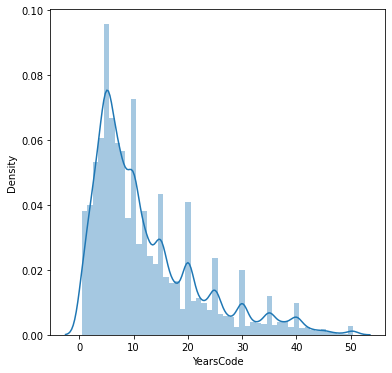

In [84]:
# Get the distribution plot
sns.distplot(survey_public['YearsCode'])

**--->**
#### OBSERVATIONS:

+ The distribution plot tells me that I have a right-skewed variable. In fact from the statistical summary, I already saw that the mean year is about 12 years while 50% of the code years were less than 10 years.

+ When dealing with skewed variables, I reduce the skew of the dataset because it can impact the accuracy of the model. This is an important step if I am going to use linear regression modeling; other algorithms, like tree-based Random Forests can handle skewed data. 

+ I will updated distribution of our target variable once I apply a **log transformation** to it. Applying a log transformation means to simply take the log of the skewed variable to improve the fit by altering the scale and making the variable more normally distributed.

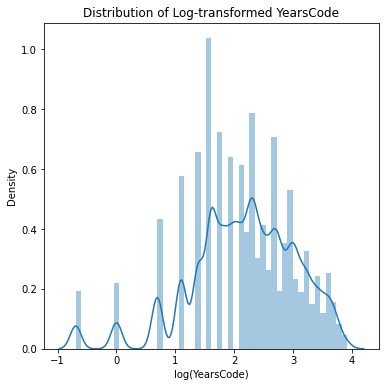

In [85]:
# Take the log to make the distribution more normal
sns.distplot(np.log(survey_public['YearsCode']))
plt.title('Distribution of Log-transformed YearsCode')
plt.xlabel('log(YearsCode)')
plt.show()

**--->**
#### OBSERVATIONS:

+ I can clearly see that the log-transformed variable is more normally distributed and I have managed to reduce the skew.

+ I can plot the distributions of all the numerical variables by calling the `distplot()` method in a for loop

**Correlations Among Numerical Attributes**

Correlation tells us the strength of the relationship between pairs of attributes. In an ideal situation, I would have an independent set of features/attributes, but real data is not ideal. It is useful to know whether some pairs of attributes are correlated and by how much because it is a good practice to remove highly correlated features.

We can use the `corr()` method to easily get the correlations and then visualize them using the heatmap() method

The `corr()` method returns pairs of all attributes and their correlation coefficients in range [-1; 1], where 1 indicates positive correlation, -1 negative correlation and 0 means no relationship between variables at all.

<AxesSubplot:>

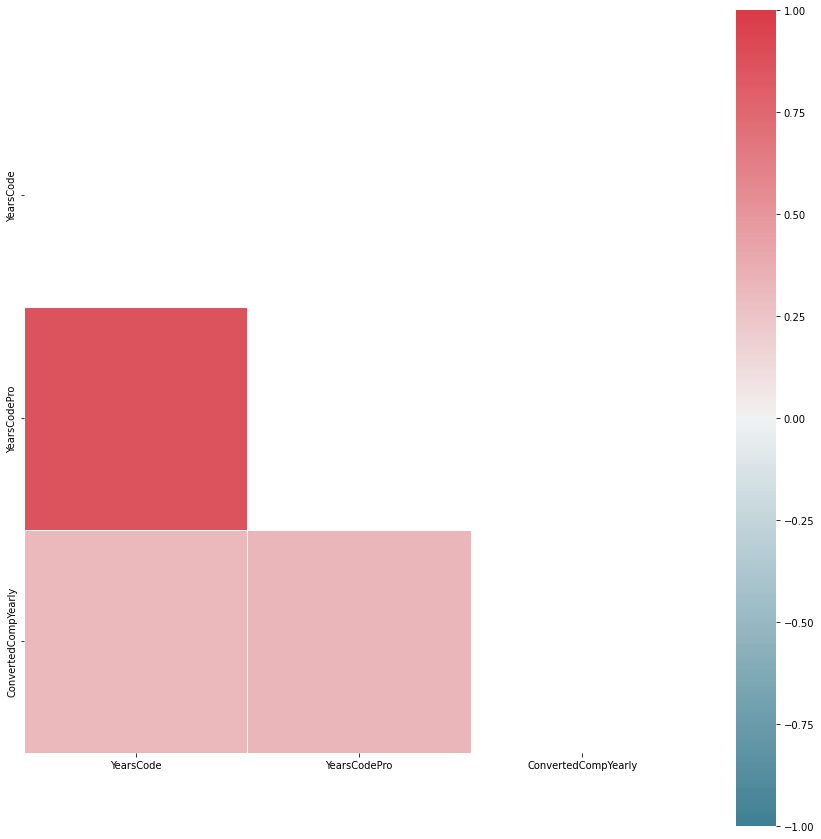

In [86]:
# Correlation of numerical attributes
corr = survey_public.corr()

# Using mask to get triangular correlation matrix
f, ax = plt.subplots(figsize=(15, 15))
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(220, 10, as_cmap=True), square=True, ax=ax, vmin = -1.0, vmax = 1.0, linewidths=.5)


**----->** 
##### OBSERVATIONS

The heatmap is helpful for a first high-level overview relationship for numerical attributes. From the heatmap, I can easily see that I have some variables that are highly correlated with `YearsCodePro` and `YearsCodePro` (darkest red), which makes sense since the longer that ones working on their coding career, the more they become proficient at that skill to become a Pro!

## 2.1.2 Categorical Values

For categorical attributes I do not get a statistical summary. But I can get some important information like number of **unique values and top values for each attribute**. 

For example, I can see that we can have 9 types of `Employment`, with **Employed full-time** being the most frequent type.

### a. Nominal Categories

+ Depending on the data, some of the summary statistics I use for quantitative data can still be meaningful for categorical data. Let’s first consider a nominal categorical variable. 

+ For nominal categorical variables, there is no ordering to the categories. Because of this, I'm limited to using the mode to describe central tendency and there is no way to summarize the spread.

In [87]:
top_country_answered = survey_public['Country'].value_counts().head(10)
top_country_answered

united states of america                                15288
india                                                   10511
germany                                                  5625
united kingdom of great britain and northern ireland     4475
canada                                                   3012
france                                                   2708
brazil                                                   2254
poland                                                   1805
netherlands                                              1772
italy                                                    1666
Name: Country, dtype: int64

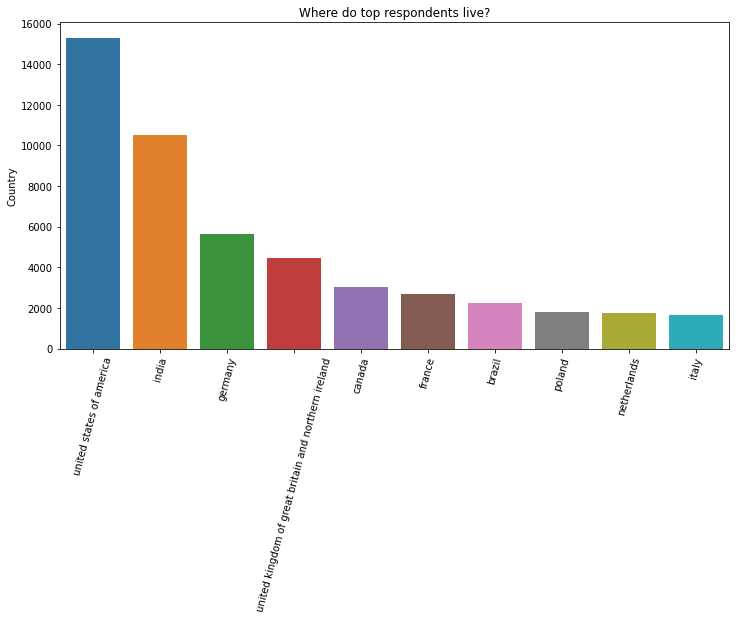

In [88]:
plt.figure(figsize=(12,6))
plt.xticks(rotation=75)
plt.title("Where do top respondents live?")
sns.barplot(x=top_country_answered.index, y=top_country_answered);

**-------->**
#### OBSERVATIONS:

It appears that a disproportionately high number of respondents are from the US and India, probably because the survey is in English, and these countries have the highest English-speaking populations. We can already see that the survey may not be representative of the global programming community - especially from non-English speaking countries. Programmers from non-English speaking countries are almost certainly underrepresented.


In fact, English is recognized as an official language in a total of 67 different countries, as well as 27 non-sovereign entities. You can use this list of [Overview of English Speaking Countries](https://www.lingoda.com/en/content/english-speaking-countries/).

In [89]:
# get the detail info about the name column for the main data set, later I can access it via slices like a list
survey_question.loc['Language']['question']

'Which <b>programming, scripting, and markup languages</b> have you done extensive development work in over the past year, and which do you want to work in over the next year? (If you both worked with the language and want to continue to do so, please check both boxes in that row.)'

In [90]:
languages_have_worked_dummy_percentages = languages_worked_dummy.mean().sort_values(ascending=False) * 100
languages_have_worked_dummy_percentages

javascript     64.222536
html/css       55.439967
python         48.986073
sql            46.543541
java           34.949304
node.js        33.527889
typescript     29.853304
c#             27.546202
bash/shell     26.827105
c++            24.037010
php            21.728709
c              20.767516
powershell     10.631846
go              9.441741
kotlin          8.228865
rust            6.950071
ruby            6.674417
dart            5.950526
assembly        5.551427
swift           5.038472
r               5.015700
vba             4.610609
matlab          4.609411
groovy          2.971068
objective-c     2.768523
scala           2.574367
perl            2.430547
haskell         2.096167
delphi          2.074594
clojure         1.860064
elixir          1.723435
lisp            1.313550
julia           1.279992
f#              0.963590
erlang          0.780220
apl             0.642393
crystal         0.558499
cobol           0.523742
dtype: float64

Text(0.5, 0, 'count')

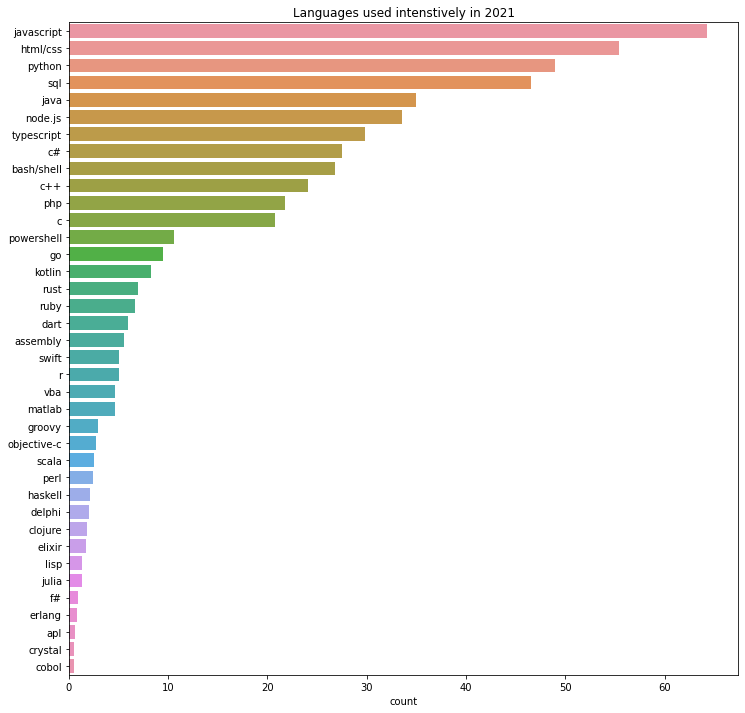

In [91]:
plt.figure(figsize=(12, 12))
sns.barplot(x=languages_have_worked_dummy_percentages, y=languages_have_worked_dummy_percentages.index)
plt.title("Languages used intenstively in 2021")
plt.xlabel('count')

**----->**
#### OBSERVATIONS:

For web developer, Javascript & HTML/CSS comes out at the top as web development is one of today's most sought skills. It also happens to be one of the easiest to get started. 

For data scientist, SQL and Python have their spot on top. SQL is necessary for working with relational databases and Python seems to be the popular choice for other forms of development.

**[Gender discrepancy on Stack Overflow](https://link.springer.com/article/10.1007/s10664-019-09685-x)**

In [122]:
gender_dummy_percentages = gender_dummy.mean().sort_values(ascending=False) * 100
gender_dummy_percentages

man                                                  91.780723
woman                                                 5.239819
prefer not to say                                     1.728229
non-binary, genderqueer, or gender non-conforming     1.399842
in your own words                                     0.906062
dtype: float64

Text(0.5, 0, 'count')

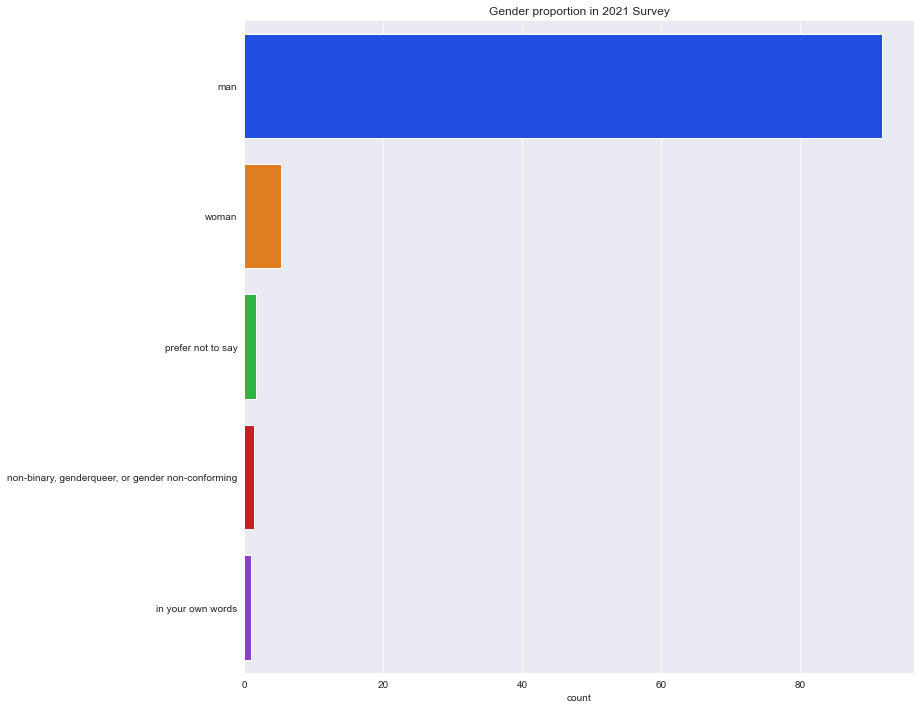

In [123]:
plt.figure(figsize=(12, 12))
sns.barplot(x=gender_dummy_percentages, y=gender_dummy_percentages.index)
plt.title("Gender proportion in 2021 Survey")
plt.xlabel('count')

**----->**
#### OBSERVATIONS:
The massive disparity in gender between men, women, and other gender types of respondents would significantly skew the further gender-tendency analysis.

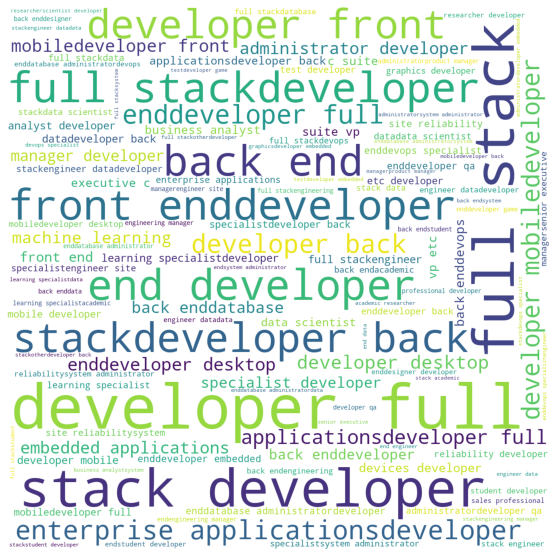

In [124]:

"""
Word Cloud¶: Developer Type base on  most of respondents worked in 2021

WordCloud = word cloud library that I import at the beginning of kernel
background_color = color of back ground
generate = generates the developer types a word cloud
"""

text = str(list(survey_public['DevType'])).replace(',', '').replace(';', '').replace("'", '').replace(']', '')

plt.rcParams['figure.figsize'] = (10, 10)
wordcloud = WordCloud(background_color = 'white', width = 1200,  height = 1200, max_words = 122).generate(text)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**------>**
#### OBSERVATIONS:
+ Web developer seems to get the most popular, first is full stack, then front and back end developer. 
+ Data Scientist or Machine Learning specialists are around 5% of those who answered the survey

### b. Ordinal Categorical Variables
+ Ordinal categorical variables have ordered categories. I can calculate **summary statistics** that are not possible for nominal categorical variables. For central tendency, this means we can also calculate a median.

+ In order to calculate numerical statistics for ordered categories, I first assign numerical values to the categories. Consider the variable `EdLevel` from the survey data. I can inspect the unique categories in this variable using `.unique()`:

+ For **ordinal categorical** variables, there is an implied ordering to the categories. In Python, we can use `pd.Categorical()` to transform a variable to a categorical type. The Categorical type allows us to access a numeric value for each category by using `.cat.codes`. From there, we may perform operations on this variable as if it were a regular, numeric variable.

+ However, when calculating statistics for an ordinal categorical variable we should be mindful that some numeric statistics rely on the assumption of **equal spacing** between categories.

+ For ordinal categorical variables, median and mode can be used to summarize the central tendency, and the IQR (or any difference between percentiles) can be used to summarize the spread.

In [95]:
print(list(survey_public['EdLevel'].unique()))

['secondary school', 'bachelor’s degree', 'master’s degree', 'other doctoral degree', 'college/university but no degree', 'something else', 'professional degree', 'primary/elementary school', 'associate degree']


**----->**
#### OBSERVATIONS

+ Then, I can associate each of these categories with a numerical value, indicating an individual’s `education level`. 

+ Convert the variable to type 'category' using `pandas.Categorical()`. When converting a column to type 'category', I can also pass a list with the column’s categories (and True to the ordered parameter) to indicate the desired ordering.

In [96]:
correct_order = ['primary/elementary school', 'secondary school', 'college/university but no degree', 'associate degree', 'bachelor’s degree', 'master’s degree', 'professional degree', 'other doctoral degree', 'something else']

survey_public['EdLevel'] = pd.Categorical(survey_public['EdLevel'], correct_order, ordered=True)

**---------->**
#### OBSERVATIONS
Variables stored as type category have an attribute (`cat.codes`) that converts the categories to numbers. This allows us to perform numerical operations on this categorical field. This allows me to calculate the median category using numpy’s `median()` function:

In [97]:
median_index = np.median(survey_public['EdLevel'].cat.codes)
print(median_index) # Output: 4.0
 
median_category = correct_order[int(median_index)]
print(median_category) # Output: bachelor’s degree

4.0
bachelor’s degree


**-------->**
#### OBSERVATIONS:

+ By using `.cat.codes` on `EdLevel`, I'm able to calculate that the median value for education level is '4' which translates to `associate degree`.

+ While I can represent these categories with equally spaced numbers, there’s not equal spacing between categories. Some gaps between educational attainment levels represent up to four additional years of schooling (e.g. '1st-4th' to '5th-6th'), while others represent a single additional year of schooling (e.g. from '9th' to '10th').

+ When we use .cat.codes to translate these categories into integers, those integers have equal spacing. While translating categories to numbers is often necessary to store and use the order of the categories (for calculating a statistic like the median, which only relies on ordering, not spacing), I should not use those numbers to calculate statistics for which the distance between values matters.


+ The `mean()` and `median()` is not interpretable for ordinal categorical variables because the mean relies on the assumption of **equal spacing** between categories.

+ Many other statistics we might normally use for numerical data rely on the mean. Because of this, these statistics aren’t appropriate for ordinal data. Moreover, The **standard deviation and variance both depend on the mean**, without a mean, I can’t have a reliable standard deviation or variance either!

+ Instead, I can rely on other summary statistics, like the proportion of the data within a range, or percentiles/quantiles. For example, consider the `EdLevel` variable, to calculate a range containing 80% of the data, I can use `np.percentile()`:

In [98]:
tenth_perc_ind = np.percentile(survey_public['EdLevel'].cat.codes, 10)
tenth_perc_cat = correct_order[int(tenth_perc_ind)]
print(tenth_perc_cat) 
 
nintieth_perc_ind = np.percentile(survey_public['EdLevel'].cat.codes, 90)
nintieth_perc_cat = correct_order[int(nintieth_perc_ind)]
print(nintieth_perc_cat)

secondary school
master’s degree


**Formal education to become a programmer?** 
Using horizontal bar plot to visualize the education levels of respondents to gain some insight into this.

**------->**
This tells me that at least 80% of respondents range in `EdLevel` from **secondary school** to a **master’s degree**.

In [99]:
# get the detail info about the name column for the main data set, later I can access it via slices like a list
survey_question.loc['EdLevel']['question']

'Which of the following best describes the highest level of formal education that you’ve completed? *'

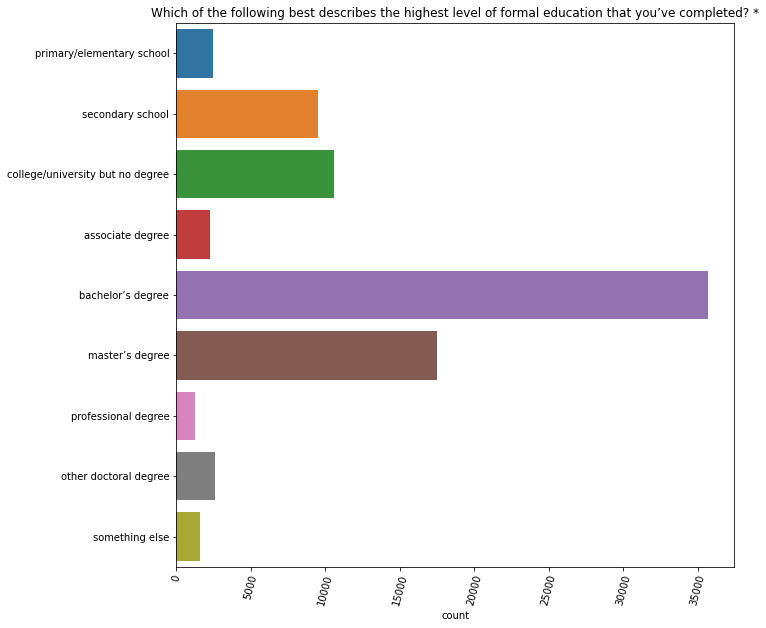

In [100]:
sns.countplot(y=survey_public.EdLevel)
plt.xticks(rotation=75)
plt.title(survey_question.loc['EdLevel']['question'])
plt.ylabel(None);

**--------->**
#### OBSERVATION

+ It appears that well over half of the respondents hold a **bachelor's** (as my median prediction) or **master's degree** (as in 80% of my prediction), so most programmers seem to have some college education. However, it's not clear whether they hold a degree in computer science.

+ There are still fair number of people who have not have university degree yet but still starting their programming carrer due to vast online resouces today.

### c. Binary Categorical Variables
Binary categorical variables have only two categories. In Python, these variables are often coded as `0`/`1` or `True`/`False`. This makes it easy to calculate the frequency/proportion of these variables in a dataset. For example, consider a variable a member of any other online developer communities, which is equal to 1 if a person not a member of any other online developer communities, and 0 otherwise. 

In [101]:
# get the detail info about the name column for the main data set, later I can access it via slices like a list
survey_question.loc['NEWOtherComms']['question']

'Are you a member of any other online developer communities?'

In [102]:
survey_public['NEWOtherComms'].value_counts()

no     53974
yes    29464
Name: NEWOtherComms, dtype: int64

In [103]:
member_online_developer_communities_frequency = (survey_public['NEWOtherComms'] == 'yes').sum()
member_online_developer_communities_proportion = (survey_public['NEWOtherComms'] == 'yes').mean()

print("The frequency of is a member any other online developer communities: ", member_online_developer_communities_frequency)
print("the proportion of is a member of any other online developer communities: ", member_online_developer_communities_proportion)

The frequency of is a member any other online developer communities:  29464
the proportion of is a member of any other online developer communities:  0.35312447565857286


**--------->**
#### OBSERVATIONS
Certain summary statistics **(e.g. frequencies and proportions)**, can be used for all categorical variables. I can create **true/false** columns and `np.sum()` and `np.mean()` to quickly summarize what proportion of my data meets certain criteria.

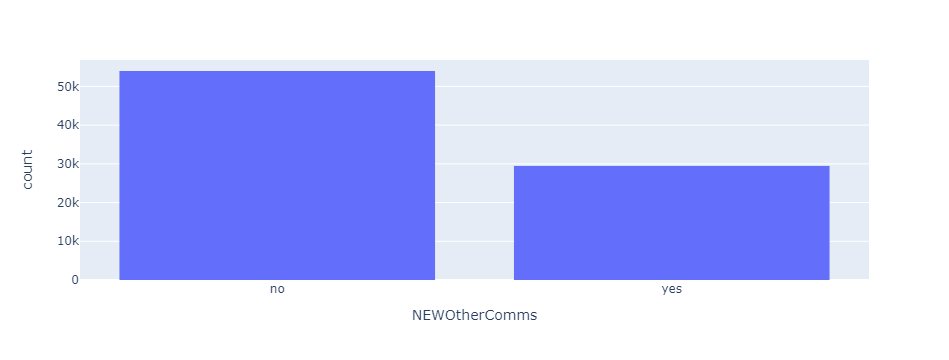

In [104]:
# Are you a member of any other online developer communities using histogram using px for binary answer
fig = px.histogram(survey_public, x = survey_public.NEWOtherComms)
fig.show()

**--------->**
#### OBSERVATIONS
Most of respondents in this survey are not belong to any online developer communities besides Stack Over Flow

# Task 2.2: Relationships between columns - Bivariate

+ Explore the relationships between columns. You need to choose **3 pairs of columns** tofocus on, and you need to generate **1 visualisation for each pair**. 

+ Each pair of columns that you choose should address a plausible hypothesis for the data concerned.

+ With each plot, state the **hypothesis** that you are investigating. Then, briefly discuss any interesting relationships (or lack of relationships) that you can observe from your visualisation.

### Bivariate Statistics

In contrast to univariate statistics, bivariate statistics are used to summarize the relationship between two variables. I should choose different summary statistics to answer questions like:

+ Do under represented countries in the survey like Vietnam tend to has less gender disparity in Tech comunity?
+ Higher education to get higher commision in women?
+ How frequency participate in other online platforms affect comisssion?

### 2.2.1. One Quantitative Variable and One Categorical Variable

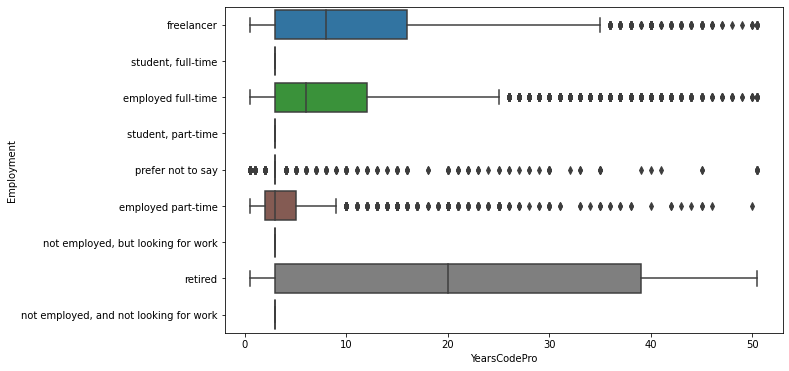

In [105]:
# The impact of Year of code on employment:
var = survey_public['Employment']
f, ax = plt.subplots(figsize=(10,6))
sns.boxplot(x=survey_public.YearsCodePro, y=var)
plt.show()

**---->**
#### OBSERVATIONS:

+ The ones who have longer years of proessionally coded less likely to be a student, unemployed, or look for work. 

+ Most of the people participate in this survey are ones who have prolong coding carrer who are retired. 

+ Only the minority of people who have 40-50 years of professionally experience are still working

### 2.2.2 Two Categorical Variables

In [106]:
# Get respondent data where Gender contains 'Woman'

#separate dataframes for men and women
women_df = survey_public.where((survey_public.Gender.str.contains('woman',na=False)), np.nan, inplace=False)
men_df = survey_public.where((survey_public.Gender.str.contains('man',na=False)), np.nan, inplace=False)
men_df.where(~(men_df.Gender.str.contains('woman',na=False)), np.nan, inplace=True)

#survey_df.Gender.value_counts()
men_df.Gender.count()
women_df.Gender.count()

4372

In [107]:
survey_public.Gender.value_counts()

man                                                                              75969
woman                                                                             4120
prefer not to say                                                                 1442
non-binary, genderqueer, or gender non-conforming                                  690
in your own words                                                                  413
man;in your own words                                                              268
man;non-binary, genderqueer, or gender non-conforming                              252
woman;non-binary, genderqueer, or gender non-conforming                            147
man;woman                                                                           41
non-binary, genderqueer, or gender non-conforming;in your own words                 21
man;woman;non-binary, genderqueer, or gender non-conforming                         21
man;woman;non-binary, genderqueer, or gende

In [108]:
women_hobbyist_pct = len(women_df[women_df.NEWOtherComms == 'yes']) * 100 / women_df.Gender.count()
men_hobbyist_pct = len(men_df[men_df.NEWOtherComms == 'yes'])  * 100 / men_df.Gender.count()

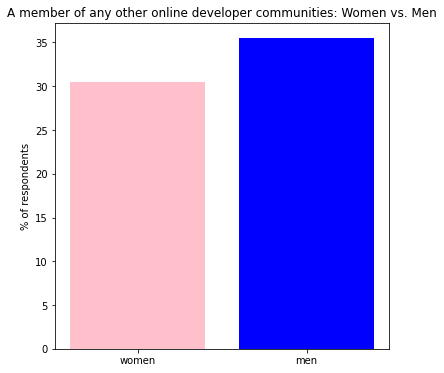

In [109]:
plt.figure(figsize=(6, 6))
plt.title('A member of any other online developer communities: Women vs. Men')
plt.ylabel('% of respondents')
plt.bar(['women', 'men'], [women_hobbyist_pct, men_hobbyist_pct], color=['pink', 'blue']);

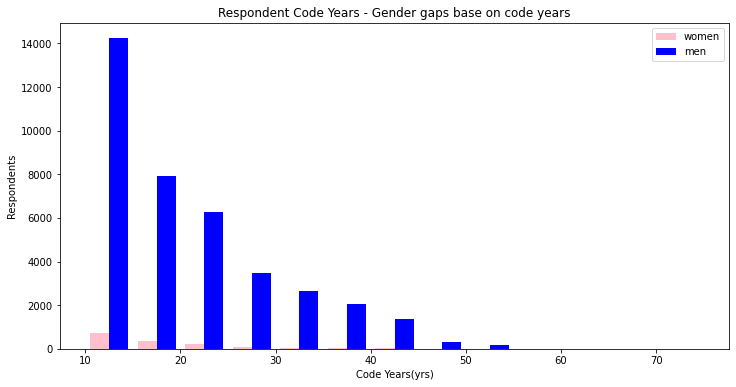

In [112]:
plt.figure(figsize=(12, 6))
plt.title('Respondent Code Years - Gender gaps base on code years')
plt.xlabel('Code Years(yrs)')
plt.ylabel('Respondents')
plt.hist([women_df.YearsCode, men_df.YearsCode], bins=np.arange(10,80,5), color=['pink','blue'], label=['women','men'])
plt.legend(loc='upper right');

The graph distribution is right-skewed. The graph sh
ows that the years curves between the genders are similar, but there are noticible differences of when women starting and ending years. 

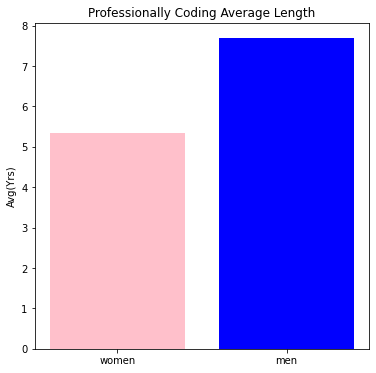

In [113]:
plt.figure(figsize=(6, 6))
plt.title('Professionally Coding Average Length')
plt.ylabel('Avg(Yrs)')
plt.bar(['women', 'men'], [women_df.YearsCodePro.mean(), men_df.YearsCodePro.mean()], color=['pink', 'blue']);

**------>**
#### OBSERVATIONS:
This graph shows that the two bars have a similar shape. The differences are the number of respondents and the number of years.
This may indicate that women tend to have a coding career length shorter than men. This is not because they have less capacity than men, but they might need to take a break to get pregnant and breastfeed.

### 2.2.3 Two Quantitative Variables
I want to know numerical columns are correlated with each other, I am interested in the relationship between `YearsCode` (`YearsCodePro`) and `ConvertedCompYearly`, which are all quantitative. I will show these relationships in task 2.3 Scatter matrix

# Task 2.3: Scatter matrix

In a scatter plot, the values of 2 variables are plotted as points on a 2-dimensional grid. Additionally, I can also use a third variable to determine the size or color of the points. 

+ Build a scatter matrix for all **numerical columns**. 

+ Note, each visualization (graph) should be complete and informative in itself, and should be clear for readers to read and obtain information

In [115]:
# get the detail info about the name column for the main data set, later I can access it via slices like a list
survey_question.loc['CompTotal']['question']

'What is your current total compensation (salary, bonuses, and perks, before taxes and deductions), in ${q://QID50/ChoiceGroup/SelectedChoicesTextEntry}? Please enter a whole number in the box below, without any punctuation. If you are paid hourly, please estimate an equivalent weekly, monthly, or yearly salary. If you prefer not to answer, please leave the box empty.'

array([[<AxesSubplot:xlabel='YearsCode', ylabel='YearsCode'>,
        <AxesSubplot:xlabel='YearsCodePro', ylabel='YearsCode'>,
        <AxesSubplot:xlabel='ConvertedCompYearly', ylabel='YearsCode'>],
       [<AxesSubplot:xlabel='YearsCode', ylabel='YearsCodePro'>,
        <AxesSubplot:xlabel='YearsCodePro', ylabel='YearsCodePro'>,
        <AxesSubplot:xlabel='ConvertedCompYearly', ylabel='YearsCodePro'>],
       [<AxesSubplot:xlabel='YearsCode', ylabel='ConvertedCompYearly'>,
        <AxesSubplot:xlabel='YearsCodePro', ylabel='ConvertedCompYearly'>,
        <AxesSubplot:xlabel='ConvertedCompYearly', ylabel='ConvertedCompYearly'>]],
      dtype=object)

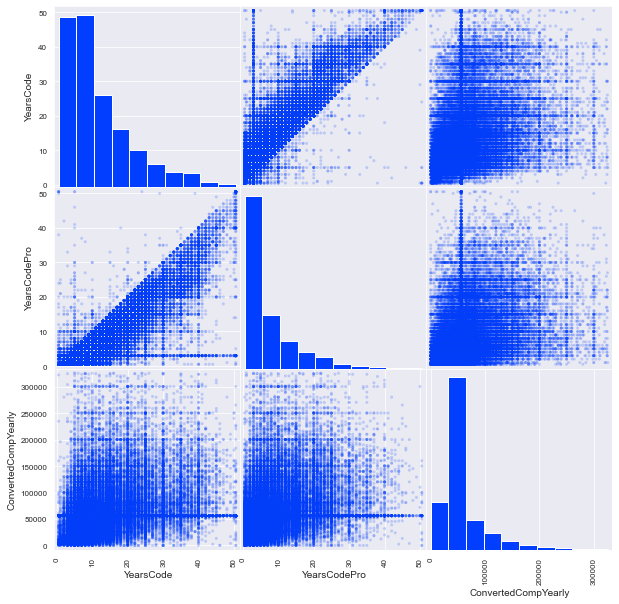

In [118]:
# plot scatter matrix
from pandas.plotting import scatter_matrix
scatter_matrix(survey_public,alpha=0.2,figsize=(10,10),diagonal='hist')

**------->**
##### OBSERVATIONS:

Based on the constructed correlation matrix as well as the constructed visualizations, it can be seen that the data possitive correlation between the `YearsCode` and `ConvertedCompYearly` or `YearsCodePro` and `ConvertedCompYearly` 

### WRITING DATA BACK TO FILES
After completing your analysis and adding new columns, I write the results back to a file and get that data to visualize on Dash App. Otherwise, the data will be lost when the Jupyter Lab shuts down. 

In [119]:
# # To write the data from the data frame into a file, use the to_csv function.
# women_df.to_csv('women_df.csv', index=False)
# men_df.to_csv('men_df.csv', index=False)

# 📖 TASK 4. VISUALIZATON DASHBOARD

Create a visualization dashboard using the provided dataset using **Dash framework** or similar 
ones. The visualization dashboard should be able to run on a local machine. 

1. There should be at least **2 “meaningful”** plots. The plots must be **self-explanatory** and can provide some **insights** on the data.

2. The plots should be interactive, which allows users to **customise** them to some extents.

3. The plots on the visualization dashboard are **automatically updated based on the source data**. The data and data retrieving code must be accessible for testing this function


**Note:** Please check `assignment1_task4.ipynb` for details

# Exporting as an Interactive HTML

In [157]:
!pip install -U kaleido

fig_ConvertedCompYearly_box.write_html('years_code_box.html')

# Conclusion

Woman tend to have less participation in Technical field. They more likely to have less coding experience which I take the data generation process. There are many confounding factors to consider, such as demographics, accessibility, languages, etc. Programmers from non-English-speaking nations and women and non-binary genders have provided fewer replies. There isn't as much diversity in the programming community as there could be. Moreover, the data comes from a sample and could not represent the population using StackOverflow or the Technical field; I could not prove my sample's analysis 100% infers that the gender gap is severely vast in Engineering and Technology community is true. However, I am confident that the inferences are not false due to how the random and great sample size of the survey was collected. Therefore, we should continue to assist and promote underrepresented populations, regardless of age, nationality, ethnicity, gender, or other factors.

# References

#### Official Documentation

+ [Python Standard Library](https://docs.python.org/3/library/)
    
+ [Matplotlib](https://matplotlib.org) 
    
+ [Seaborn](https://seaborn.pydata.org)

+ [NumPy: the absolute basics for beginners](https://numpy.org/doc/stable/user/absolute_beginners.html)

+ [Tidy Data by Hadley Wickham](http://vita.had.co.nz/papers/tidy-data.pdf)

+ [What is EDA](https://www.itl.nist.gov/div898/handbook/eda/section1/eda11.htm)

+ [Getting Started with Plotly](https://plotly.com/python/getting-started/)
    
+ [Deploying Dash Apps](https://dash.plotly.com/deployment)
    
+ [Book: Whirlwind Tour of Python, Jake VanderPlas](https://jakevdp.github.io/WhirlwindTourOfPython/08-defining-functions.html#Anonymous-(lambda)-Functions)



#### Towards datas cience:

+ [Working with missing values in Pandas](https://towardsdatascience.com/working-with-missing-values-in-pandas-5da45d16e74)
+ [10 tricks for converting Data to a Numeric Type in Pandas](https://towardsdatascience.com/converting-data-to-a-numeric-type-in-pandas-db9415caab0b)
+ [How To Change Column Type in Pandas DataFrames](https://towardsdatascience.com/how-to-change-column-type-in-pandas-dataframes-d2a5548888f8)
+ [Dealing with extra white spaces while reading CSV in Pandas](https://towardsdatascience.com/dealing-with-extra-white-spaces-while-reading-csv-in-pandas-67b0c2b71e6a)


#### More:
+ [Imputing Missing Data: Playing with Fire](https://www.linkedin.com/pulse/imputing-missing-data-playing-fire-jehan-gonsal/)

+ [Supported data types in PyTables](https://www.pytables.org/usersguide/datatypes.html)
    
+ https://github.com/pandas-profiling/pandas-profiling
    
+ https://towardsdatascience.com/cleaning-analyzing-and-visualizing-survey-data-in-python-42747a13c713
    
+ [Missing Data in Pandas](https://pandas.pydata.org/pandas-docs/stable/user_guide/missing_data.html)
         
+ [A Simple Tutorial on Exploratory Data Analysis](https://www.kaggle.com/spscientist/a-simple-tutorial-on-exploratory-data-analysis)

+ [The Data Visualisation Catalogue](https://datavizcatalogue.com/)

+ [Documentation: API reference — seaborn](https://seaborn.pydata.org/api.html)
    
+ [Structure of a Data Analysis Report](http://www.stat.cmu.edu/~brian/701/notes/paper-structure.pdf)
    
+ [How to write data analysis reports. Lesson -2 know your audience.](https://bigdata-madesimple.com/write-data-analysis-reports-lesson-2-know-audience/)

+ [Ban Bossy](https://banbossy.com/)
    
- [Other encoding techniques with category_encoder](https://contrib.scikit-learn.org/category_encoders/)

- [Categorical data with big data using pyspark](https://towardsdatascience.com/feature-encoding-with-spark-2-3-0-part-1-9ede45562740)

- [More on Categorical_encoding](https://www.analyticsvidhya.com/blog/2020/08/types-of-categorical-data-encoding/)
    
+ [Python for Data Analysis (book by Wes McKinney - creator of Pandas](https://www.oreilly.com/library/view/python-for-data/9781491957653/)
    
+ [Girls Who Code](https://girlswhocode.com/)

+ [Girls will Code | Isabel Sieh | TEDxBritishSchoolManila](https://www.youtube.com/watch?v=YQDXpu3t7Og&ab_channel=TEDxTalks)